<br>

### Facial Recognition

hw10 option 1

First make sure you have our new library OpenCV (Open Source Computer Vision Library)

More info on the libary can be found here: https://opencv.org/

In your terminal (or in a notebook cell!), run `!pip install opencv-python`
+ only use the <tt>!</tt> if you're inside Python

THEN, run the cells below...

We have provided a new open-image function using OpenCV. There is also a new function to save images

In [24]:
pip install imutils

Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [10]:
# libraries!
import numpy as np
from matplotlib import pyplot as plt
import cv2 as cv
import seaborn as sns

# magic function to display images in the notebook
%matplotlib inline

In [11]:
def opencv_open_into_rgb( image_file_name ):
    """ open image_file_name and convert to rgb """
    image_raw = cv.imread(image_file_name, cv.IMREAD_COLOR)  # reads into BGR
    orig_num_rows, orig_num_cols, _ = image_raw.shape          # cool underscore variable!
    num_rows, num_cols, _ = image_raw.shape
    print(f"image with name {image_file_name} read with dimensions: {image_raw.shape}")
    
    # let's resize as long as any dimension is > 840...

    maxdim = max(num_rows,num_cols)
    while maxdim > 840:
        num_rows = num_rows//2  # halve!
        num_cols = num_cols//2  # halve!
        maxdim = max(num_rows,num_cols) # try again...
        
    if orig_num_rows != num_rows: # did we resize?
        print(f"resizing to rows, cols = {num_rows}, {num_cols}")
        image_raw = cv.resize(image_raw, dsize=(num_cols,num_rows), interpolation=cv.INTER_LINEAR)  # resizing
        
    # now, convert to rgb
    image_rgb = cv.cvtColor(image_raw, cv.COLOR_BGR2RGB)     # convert from BGR to RGB
    return image_rgb

In [12]:
# img = imutils.url_to_image(fileurl)

In [13]:
cd CS189

[Errno 2] No such file or directory: 'CS189'
/Users/waverlywang/Documents/CS189/wcdataset


In [14]:
cd wcdataset

[Errno 2] No such file or directory: 'wcdataset'
/Users/waverlywang/Documents/CS189/wcdataset


image with name truesummercool.png read with dimensions: (750, 600, 3)


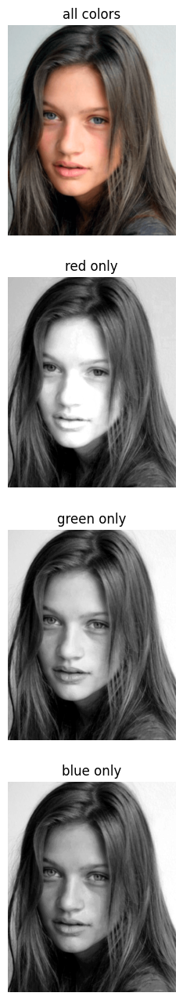

In [15]:
filename = "truesummercool.png"  # "coffee.jpg"  "flag.png"  "avengers.jpg" ... try others
# filename = "coffee.jpg" # "flag.png"  "avengers.jpg" ... try others
# filename = "flag.png" # "avengers.jpg" ... try others

image_rgb = opencv_open_into_rgb(filename) 

fig, ax = plt.subplots(4,1, figsize=(6,16))  # this means ax will be a 1x4 numpy array of axes!

ax[0].imshow(image_rgb)                     # normal image
ax[0].axis('off')  
ax[0].set_title('all colors')  

ax[1].imshow(image_rgb[:,:,0],cmap="gray")  # red-channel image
ax[1].axis('off')  
ax[1].set_title('red only') 

ax[2].imshow(image_rgb[:,:,1],cmap="gray")  # green-channel image
ax[2].axis('off')  
ax[2].set_title('green only') 

ax[3].imshow(image_rgb[:,:,2],cmap="gray")  # blue-channel image
ax[3].axis('off')  
ax[3].set_title('blue only') 

plt.show()

In [16]:
def save_rgb_image( image_rgb, new_file_name ):
    """ saves the image  image_rgb  to the (string) name, new_file_name
        add the extension you'd like, png, jpg, ... it knows many (not all)
    """
    image_bgr = cv.cvtColor(image_rgb, cv.COLOR_RGB2BGR)     # convert from BGR to RGB
    result = cv.imwrite(new_file_name,image_bgr)
    if result == True:
        print(f"image_rgb was saved to {new_file_name}")
    else:
        print(f"there was a problem saving image_rgb to {new_file_name}")

In [17]:
filename = "truesummercool.png"  # "coffee.jpg"  "flag.png"  "avengers.jpg" ... try others
image_rgb = opencv_open_into_rgb(filename) 
save_rgb_image( image_rgb, "new_image.png" )  # it needs the extension

image with name truesummercool.png read with dimensions: (750, 600, 3)
image_rgb was saved to new_image.png


<br>

#### Now we'll try the facial recognition itself...


The cell below contains the "cascades," the pre-trained, "transferred" models...

More info here:  
https://github.com/opencv/opencv/tree/master/data/haarcascades

https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades_cuda/haarcascade_profileface.xml

Run the cells to see how it works!

In [18]:
# cascPath = "./haarcascade_frontalface_default.xml"
# cascPath = "./haarcascade_frontalface_alt_tree.xml"
#cascPath = "./haarcascade_frontalface_alt.xml"
#cascPath = "./haarcascade_profileface_newer.xml"
faceCascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
# faceCascade = cv.CascadeClassifier(cascPath)

# this link helped me figure out the cascade

In [19]:
# https://stackoverflow.com/questions/59166301/python-opencv-error-with-cascadeclassifier

In [20]:
import imutils
import cv2

In [21]:


def facialrecognition(imageinput):
# Read the fileurl and return the faces
    if isinstance(imageinput, np.ndarray): #testing if numpy image
        image = imutils.resize(imageinput,width=250)
    elif isinstance(imageinput, str): # if it's a string
        if imageinput[0:6] == 'https:': #if url    
            image =  imutils.url_to_image(imageinput)
            image = imutils.resize(image,width=250) # important step to resize bc the min size of face was small in comparison to some images before. :0
        else: #it's a file
            image=cv2.imread(imageinput)
            image = imutils.resize(image,width=250) #resize

    fig, ax = plt.subplots()
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.axis('off')  


    ax.set_title('Color') 
    plt.show()

    image_faces_gray = cv.cvtColor(image, cv.COLOR_RGB2GRAY)

    # fig, ax = plt.subplots()
    # ax.imshow(image_faces_gray,cmap="gray")
    # ax.axis('off')  
    # ax.set_title('Gray') 
    # plt.show()

        # Detect faces in the image
    faces = faceCascade.detectMultiScale(
        image_faces_gray,       # this is the input image
        scaleFactor=1.05,       # this is the scale-resolution for detecting faces
        minNeighbors=1,         # this is how many nearby-detections are needed to ok a face
        minSize=(10,10),        # this is the minimum size for a face
        flags = cv.CASCADE_SCALE_IMAGE, 
        # (standard)

    )
    print(f"Found {len(faces)} faces!")

    maximum = 0  # keep track of the confidence levels. Highest confidence level is the one with biggest bounding box.
    maxFace = 0
    for i, face in enumerate(faces):
        x,y,w,h = face
        if w*h > maximum:
            maximum = w*h
            maxFace = i
        print(f"face {i}: {face}")
    print(f"the face that is probably a face is {maxFace} with a size of {maximum}")
        
    

    image_faces_drawn_rgb = image.copy()  # copy onto which we draw the bounding boxes for the faces

    # Draw a rectangle around the faces
    for (x, y, w, h) in faces:
        # note that this draws on the color image!
        cv.rectangle(image_faces_drawn_rgb, (x, y), (x+w, y+h), (0, 255, 0), 2) 

    print(f"Drawn! How does it do?")

    LoFi = []  # list of Face images

   
    for (x, y, w, h) in faces: 
        # note that this draws on the color image!
        face = image[y:y+h,x:x+h,:]  #, (x, y), (x+w, y+h), (0, 255, 0), 2)  
        LoFi.append( face )
        value = w*h
       


    # show the image!
    fig, ax = plt.subplots(figsize=(6,6)) 
    plt.imshow(cv2.cvtColor(image_faces_drawn_rgb,cv2.COLOR_BGR2RGB))
    ax.axis('off')  
    ax.set_title('FACES???') 
    plt.show()

    # printing the graph of LoFi
    print(f"There are {len(LoFi)} faces detected - they are held in the list 'LoFi'")
    print(f"Here are some of them...")

    
    fig, ax = plt.subplots(3,3)  # this means ax will be a 3x3 numpy array of axes!
    #ax[0,0].imshow(LoFi[0])
    #ax[0,0].imshow(cv2.resize(LoFi[0],dsize=(20,20)))
    ax[0,0].imshow(cv2.cvtColor(LoFi[0],cv2.COLOR_BGR2RGB))
    ax[0,0].axis('off') 
    if len(LoFi) >= 2: 
        ax[0,1].imshow(cv2.cvtColor(LoFi[1],cv2.COLOR_BGR2RGB))
        ax[0,1].axis('off')
    if len(LoFi) >= 3: 
        ax[0,2].imshow(cv2.cvtColor(LoFi[2],cv2.COLOR_BGR2RGB))
        ax[0,2].axis('off')
    if len(LoFi) >= 4: 
        ax[1,0].imshow(cv2.cvtColor(LoFi[3],cv2.COLOR_BGR2RGB))
        ax[1,0].axis('off')
    if len(LoFi) >= 5: 
        ax[1,1].imshow(cv2.cvtColor(LoFi[4],cv2.COLOR_BGR2RGB))
        ax[1,1].axis('off')
    if len(LoFi) >= 6: 
        ax[1,2].imshow(cv2.cvtColor(LoFi[5],cv2.COLOR_BGR2RGB))
        ax[1,2].axis('off')
    if len(LoFi) >= 7: 
        ax[2,0].imshow(cv2.cvtColor(LoFi[6],cv2.COLOR_BGR2RGB))
        ax[2,0].axis('off')
    if len(LoFi) >= 8: 
        ax[2,1].imshow(cv2.cvtColor(LoFi[7],cv2.COLOR_BGR2RGB))
        ax[2,1].axis('off')
    if len(LoFi) >= 9: 
        ax[2,2].imshow(cv2.cvtColor(LoFi[8],cv2.COLOR_BGR2RGB)) 
        ax[2,2].axis('off')
    plt.show()

    return LoFi[maxFace]

In [22]:

cd wcdataset

[Errno 2] No such file or directory: 'wcdataset'
/Users/waverlywang/Documents/CS189/wcdataset


# BLOB

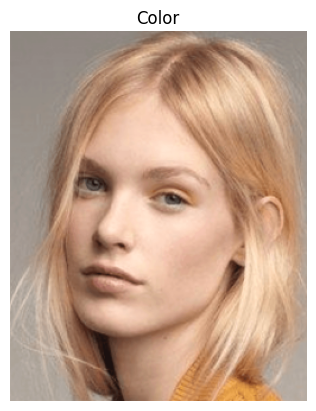

Found 1 faces!
face 0: [ 15  69 170 170]
the face that is probably a face is 0 with a size of 28900
Drawn! How does it do?


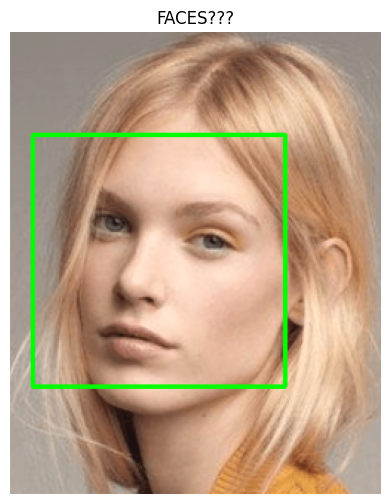

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


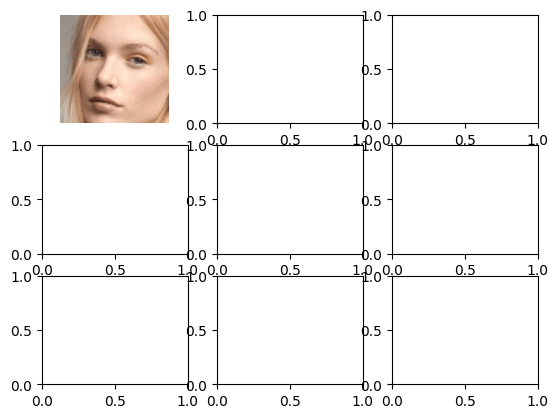

array([[[134, 143, 153],
        [134, 143, 153],
        [134, 143, 152],
        ...,
        [147, 183, 222],
        [151, 182, 221],
        [154, 182, 222]],

       [[134, 143, 153],
        [135, 142, 152],
        [134, 142, 151],
        ...,
        [147, 183, 222],
        [148, 183, 222],
        [148, 183, 222]],

       [[134, 143, 153],
        [135, 142, 151],
        [135, 142, 151],
        ...,
        [147, 181, 220],
        [148, 179, 218],
        [147, 182, 221]],

       ...,

       [[156, 166, 176],
        [160, 169, 178],
        [152, 162, 172],
        ...,
        [162, 198, 237],
        [149, 185, 225],
        [162, 198, 237]],

       [[162, 172, 182],
        [160, 169, 178],
        [157, 167, 176],
        ...,
        [158, 195, 232],
        [149, 185, 224],
        [170, 204, 242]],

       [[161, 171, 181],
        [159, 167, 176],
        [161, 171, 181],
        ...,
        [161, 197, 234],
        [163, 199, 237],
        [178, 212, 249]]

In [23]:
facialrecognition("lightspringwarm.png")

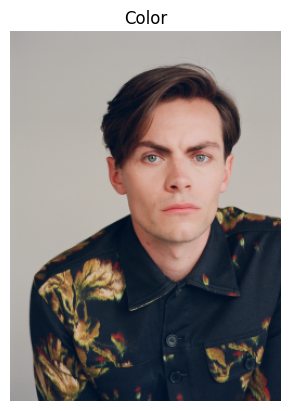

Found 1 faces!
face 0: [102  73 107 107]
the face that is probably a face is 0 with a size of 11449
Drawn! How does it do?


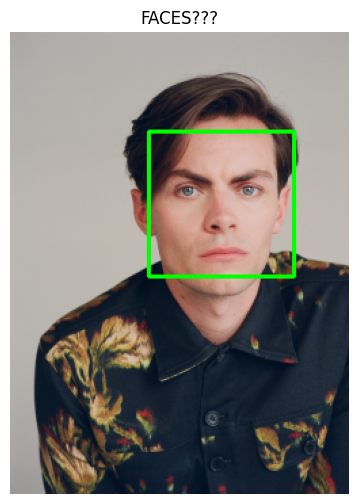

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


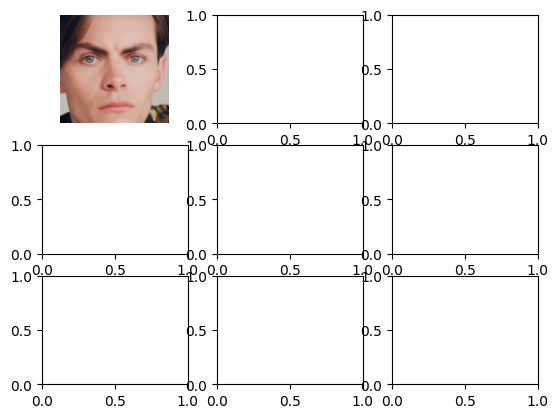

In [24]:

freddyurl = "https://visualtalesmagazine.com/wp-content/uploads/2021/10/Freddy2.jpg"
# image =  imutils.url_to_image(freddyurl)
# image = imutils.resize(image,width=250)
# fig, ax = plt.subplots()
# plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
# ax.axis('off')  


# ax.set_title('Color') 
# plt.show()



freddyinput1 = facialrecognition(freddyurl)

## now I'm gonna try my saturation function



In [25]:
# def saturationtry2(numpyarray): #not as good. I THINK BRIGHT SHOULD BE CONTRAST NOT SATURATION... 

#     # Get Image from URL. If you want to upload an image file and use that comment the below code and replace with  image=cv2.imread("FILE_NAME")
    # # img =  imutils.url_to_image(fileurl)

    # # Resize image to a width of 250
    # numpyarray= imutils.resize(numpyarray,width=250)

    # #Show image
    # plt.imshow(cv2.cvtColor(numpyarray,cv2.COLOR_BGR2RGB))
    # plt.show()

    # img_hsv = cv2.cvtColor(numpyarray, cv2.COLOR_BGR2HSV)
    # saturation = img_hsv[:, :, 1].mean() #mean of the second channel

    # if saturation > 50:
    #     return "clear", saturation
    # elif saturation <= 50:
    #     return "muted", saturation

In [26]:
# saturationtry2(LoFi[1])

# Now I'm gonna try a different way to calculate the saturation

In [27]:
def saturationtry3(numpyarray): # LET's USE THIS ONE. 
    # saturation that will just use contrast of an image. 
    # takes in a numpy array
    # the contrast will be between 0 and 1
    # https://stackoverflow.com/questions/58821130/how-to-calculate-the-contrast-of-an-image

    
    # load image as YUV (or YCbCR) and select Y (intensity)
    # or convert to grayscale, which should be the same.
    # Alternately, use L (luminance) from LAB.
    plt.imshow(cv2.cvtColor(numpyarray,cv2.COLOR_BGR2RGB))
    Y = cv2.cvtColor(numpyarray, cv2.COLOR_BGR2YUV)[:,:,0]


    # compute min and max of Y
    min = np.min(Y)
    max = np.max(Y)

    # compute contrast
    contrast = (max-min)/(max+min)
    
    print(f"the min {min},max {max},the contrast*100 is {contrast*100}")
    if contrast*100 > 50:
        return "clear", contrast*100
    else:
        return "muted", contrast*100

the min 10,max 203,the contrast*100 is 90.61032863849765


('clear', 90.61032863849765)

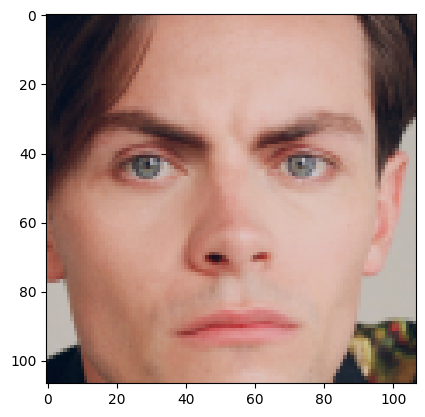

In [28]:
saturationtry3(freddyinput1)

In [29]:
# def clearorsoft(numpyarray):
#     ## averages contrast and saturation levels together!
#     attribute, level1 = saturationtry2(numpyarray) 
#     attribute, level2 = saturationtry3(numpyarray)
#     average = (level1 +level2)/2
#     if average > 50:
#         return "clear", average
#     else:
#         return "soft", average

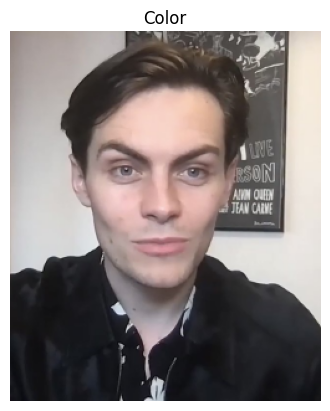

Found 1 faces!
face 0: [ 55  60 132 132]
the face that is probably a face is 0 with a size of 17424
Drawn! How does it do?


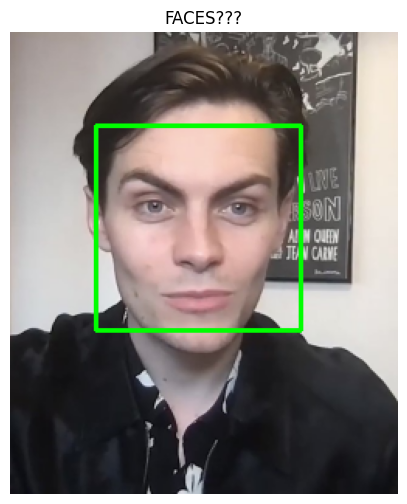

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


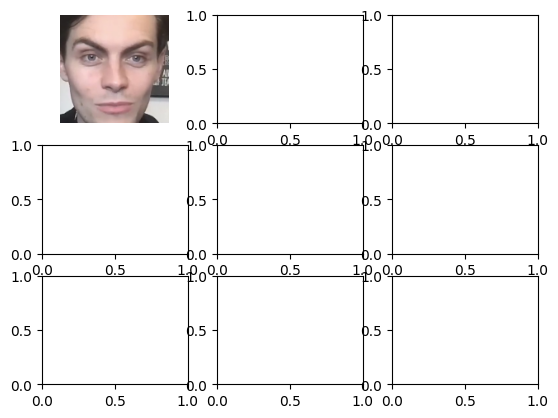

In [30]:
#Try it on light freddy
lightfreddy = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/e1/Freddy_carter_2021_1.jpg/640px-Freddy_carter_2021_1.jpg"
freddyinput = facialrecognition(lightfreddy) #use facial detection first

# clearorsoft(freddyinput[0])



the min 18,max 234,the contrast*100 is 85.71428571428571


('clear', 85.71428571428571)

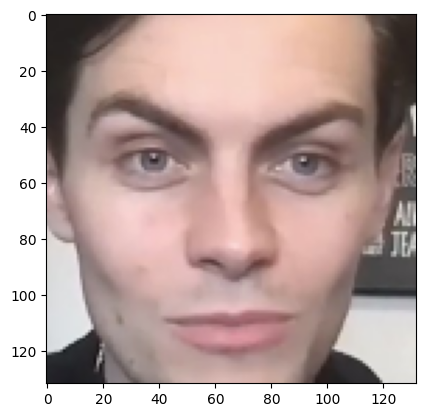

In [31]:
saturationtry3(freddyinput)

## Now I'll try to make a function that will calculate the value

In [32]:
freddy = "https://visualtalesmagazine.com/wp-content/uploads/2021/10/Freddy2.jpg"

## maybe it will take in a numpy array then extract ... dominant colors. Get rgb, and find the values. 


In [33]:
import colorsys
def getRGB(fileurl):
    """ reads a numpy array and returns the value. 
    """
    img =  imutils.url_to_image(fileurl)
    num_rows = len(img) 
    num_cols = len(img[0]) 
    for row in range(num_rows):             # loop over each row
        for col in range(num_cols):         # loop over each column
            r, g, b = image_rgb[row][col]   # the "old" pixel's rgb
            h,s,v = colorsys.rgb_to_hsv(r, g, b)
            return (h,s,v)


In [34]:
getRGB(freddy)

(0.5166666666666666, 0.050505050505050504, 198)

In [35]:
pip install imutils


[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [36]:
pip install sklearn


[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [37]:
pip install sklearn.cluster

ERROR: Could not find a version that satisfies the requirement sklearn.cluster (from versions: none)
ERROR: No matching distribution found for sklearn.cluster

[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [38]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
from collections import Counter
import imutils
import pprint
from matplotlib import pyplot as plt

In [39]:
pip install KMeans


[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [40]:
def extractSkin(image):
  # Taking a copy of the image
  img =  image.copy()
  # Converting from BGR Colours Space to HSV
  img =  cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
  
  # Defining HSV Threadholds
  lower_threshold = np.array([0, 48, 80], dtype=np.uint8)
  upper_threshold = np.array([20, 255, 255], dtype=np.uint8)
  
  # Single Channel mask,denoting presence of colours in the about threshold
  skinMask = cv2.inRange(img,lower_threshold,upper_threshold)
  
  # Cleaning up mask using Gaussian Filter
  skinMask = cv2.GaussianBlur(skinMask,(3,3),0)
  
  # Extracting skin from the threshold mask
  skin  =  cv2.bitwise_and(img,img,mask=skinMask)
  
  # Return the Skin image
  return cv2.cvtColor(skin,cv2.COLOR_HSV2BGR)



In [41]:
def removeBlack(estimator_labels, estimator_cluster):
  
  
  # Check for black
  hasBlack = False
  
  # Get the total number of occurance for each color
  occurance_counter = Counter(estimator_labels)

  
  # Quick lambda function to compare to lists
  compare = lambda x, y: Counter(x) == Counter(y)
   
  # Loop through the most common occuring color
  for x in occurance_counter.most_common(len(estimator_cluster)):
    
    # Quick List comprehension to convert each of RBG Numbers to int
    color = [int(i) for i in estimator_cluster[x[0]].tolist() ]
    
  
    
    # Check if the color is [0,0,0] that if it is black 
    if compare(color , [0,0,0]) == True:
      # delete the occurance
      del occurance_counter[x[0]]
      # remove the cluster 
      hasBlack = True
      estimator_cluster = np.delete(estimator_cluster,x[0],0)
      break
      
   
  return (occurance_counter,estimator_cluster,hasBlack)
    
    

In [42]:
def getColorInformation(estimator_labels, estimator_cluster,hasThresholding=False):
  
  # Variable to keep count of the occurance of each color predicted
  occurance_counter = None
  
  # Output list variable to return
  colorInformation = []
  
  
  #Check for Black
  hasBlack =False
  
  # If a mask has be applied, remove th black
  if hasThresholding == True:
    
    (occurance,cluster,black) = removeBlack(estimator_labels,estimator_cluster)
    occurance_counter =  occurance
    estimator_cluster = cluster
    hasBlack = black
    
  else:
    occurance_counter = Counter(estimator_labels)
 
  # Get the total sum of all the predicted occurances
  totalOccurance = sum(occurance_counter.values()) 
  
 
  # Loop through all the predicted colors
  for x in occurance_counter.most_common(len(estimator_cluster)):
    
    index = (int(x[0]))
    
    # Quick fix for index out of bound when there is no threshold
    index =  (index-1) if ((hasThresholding & hasBlack)& (int(index) !=0)) else index
    
    # Get the color number into a list
    color = estimator_cluster[index].tolist()
    
    # Get the percentage of each color
    color_percentage= (x[1]/totalOccurance)
    
    #make the dictionay of the information
    colorInfo = {"cluster_index":index , "color": color , "color_percentage" : color_percentage }
    
    # Add the dictionary to the list
    colorInformation.append(colorInfo)
    
      
  return colorInformation 

In [43]:

def extractDominantColor(image,number_of_colors=5,hasThresholding=False):
  
  # Quick Fix Increase cluster counter to neglect the black(Read Article) 
  if hasThresholding == True:
    number_of_colors +=1
  
  # Taking Copy of the image
  img = image.copy()
  
  # Convert Image into RGB Colours Space
  img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  
  # Reshape Image
  img = img.reshape((img.shape[0]*img.shape[1]) , 3)
  
  #Initiate KMeans Object
  estimator = KMeans(n_clusters=number_of_colors, random_state=0)
  
  # Fit the image
  estimator.fit(img)
  
  # Get Colour Information
  colorInformation = getColorInformation(estimator.labels_,estimator.cluster_centers_,hasThresholding)
  return colorInformation
  
  

In [44]:
def plotColorBar(colorInformation):
  #Create a 500x100 black image
  color_bar = np.zeros((100,500,3), dtype="uint8")
  
  top_x = 0
  for x in colorInformation:    
    bottom_x = top_x + (x["color_percentage"] * color_bar.shape[1])

    color = tuple(map(int,(x['color'])))
  
    cv2.rectangle(color_bar , (int(top_x),0) , (int(bottom_x),color_bar.shape[0]) ,color , -1)
    top_x = bottom_x
  return color_bar

In [45]:
def prety_print_data(color_info):
  for x in color_info:
    print(pprint.pformat(x))
    print()

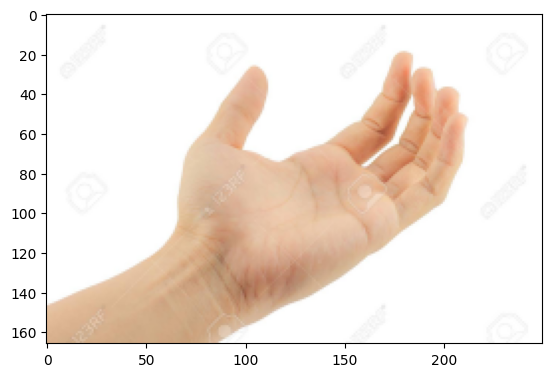

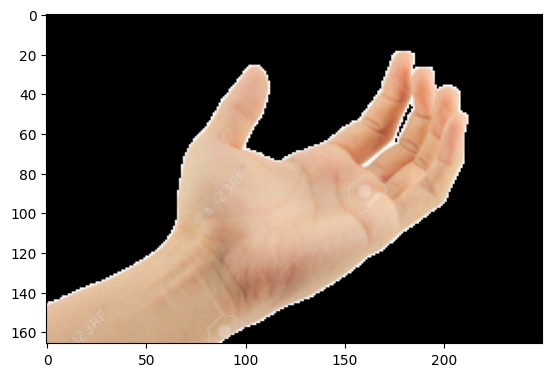

Color Information
{'cluster_index': 4,
 'color': [223.17459643160703, 182.13084112149522, 149.45475785896227],
 'color_percentage': 0.3173764792404894}

{'cluster_index': 2,
 'color': [231.21322976697763, 196.96166374342374, 168.30919569030226],
 'color_percentage': 0.2679013171090459}

{'cluster_index': 0,
 'color': [211.76450173525126, 165.45537927615248, 130.93207734258718],
 'color_percentage': 0.2673664504914087}

{'cluster_index': 3,
 'color': [195.4774066797645, 135.26784544859157, 101.25278323510138],
 'color_percentage': 0.10075549909741258}

{'cluster_index': 1,
 'color': [248.32137733142054, 243.87087517934032, 238.32711621233858],
 'color_percentage': 0.04660025406164338}

Color Bar


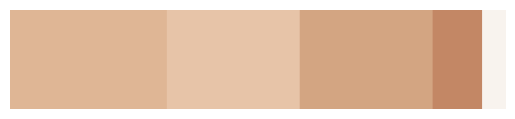

In [46]:


'''
Skin Image Primary : https://raw.githubusercontent.com/octalpixel/Skin-Extraction-from-Image-and-Finding-Dominant-Color/master/82764696-open-palm-hand-gesture-of-male-hand_image_from_123rf.com.jpg
Skin Image One     : https://raw.githubusercontent.com/octalpixel/Skin-Extraction-from-Image-and-Finding-Dominant-Color/master/skin.jpg
Skin Image Two     : https://raw.githubusercontent.com/octalpixel/Skin-Extraction-from-Image-and-Finding-Dominant-Color/master/skin_2.jpg
Skin Image Three   : https://raw.githubusercontent.com/octalpixel/Skin-Extraction-from-Image-and-Finding-Dominant-Color/master/Human-Hands-Front-Back-Image-From-Wikipedia.jpg

'''

# just ChANge this TO OTHER THING TO GET IMAGE. 
# Get Image from URL. If you want to upload an image file and use that comment the below code and replace with  image=cv2.imread("FILE_NAME")
image =  imutils.url_to_image("https://raw.githubusercontent.com/octalpixel/Skin-Extraction-from-Image-and-Finding-Dominant-Color/master/82764696-open-palm-hand-gesture-of-male-hand_image_from_123rf.com.jpg")

#THIS STAYS THE SAME FOR FILE OR URL. 
# Resize image to a width of 250
image = imutils.resize(image,width=250)

#Show image
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.show()


# Apply Skin Mask
skin = extractSkin(image)

plt.imshow(cv2.cvtColor(skin,cv2.COLOR_BGR2RGB))
plt.show()



# Find the dominant color. Default is 1 , pass the parameter 'number_of_colors=N' where N is the specified number of colors 
dominantColors = extractDominantColor(skin,hasThresholding=True)




#Show in the dominant color information
print("Color Information")
prety_print_data(dominantColors)


#Show in the dominant color as bar
print("Color Bar")
colour_bar = plotColorBar(dominantColors)
plt.axis("off")
plt.imshow(colour_bar)
plt.show()




In [47]:
url = "http://"

url[0:5]

'http:'

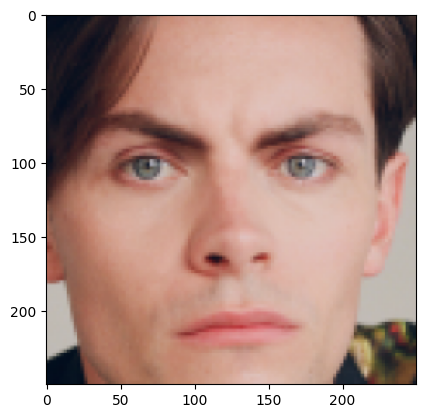

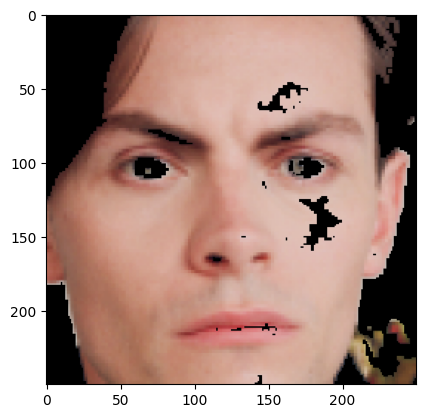

Color Information
Color Bar


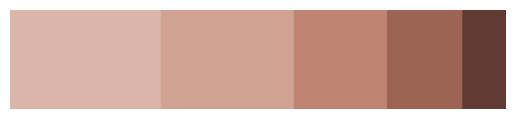

[{'cluster_index': 4,
  'color': [219.51397485178268, 181.74936477946687, 169.64453710339473],
  'color_percentage': 0.3058797969623353},
 {'cluster_index': 0,
  'color': [209.7925637445796, 162.33161878168946, 146.91226394297928],
  'color_percentage': 0.2674843475341194},
 {'cluster_index': 2,
  'color': [191.55403158769653, 132.52452202826314, 114.31369492934343],
  'color_percentage': 0.18838261144358198},
 {'cluster_index': 1,
  'color': [158.35837470603602, 100.55330546119708, 83.95218186569096],
  'color_percentage': 0.15133021271553002},
 {'cluster_index': 3,
  'color': [96.28639672429387, 59.50750682438639, 51.61624203821629],
  'color_percentage': 0.08692303134443326}]

In [48]:

def skinextractor(imageinput):

    if isinstance(imageinput, np.ndarray): #testing if numpy image
        image = imutils.resize(imageinput,width=250)
    elif isinstance(imageinput, str): # if it's a string
        if imageinput[0:6] == 'https:': #if url    
            image =  imutils.url_to_image(imageinput)
        else: #it's a file
            image=cv2.imread(imageinput)

    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.show()

    
    # Apply Skin Mask
    skin = extractSkin(image)

    plt.imshow(cv2.cvtColor(skin,cv2.COLOR_BGR2RGB))
    plt.show()



    # Find the dominant color. Default is 1 , pass the parameter 'number_of_colors=N' where N is the specified number of colors 
    dominantColors = extractDominantColor(skin,hasThresholding=True)




    #Show in the dominant color information
    print("Color Information")
    # prety_print_data(dominantColors)


    #Show in the dominant color as bar
    print("Color Bar")
    colour_bar = plotColorBar(dominantColors)
    plt.axis("off")
    plt.imshow(colour_bar)
    plt.show()
    return dominantColors
    
skinextractor(freddyinput1)

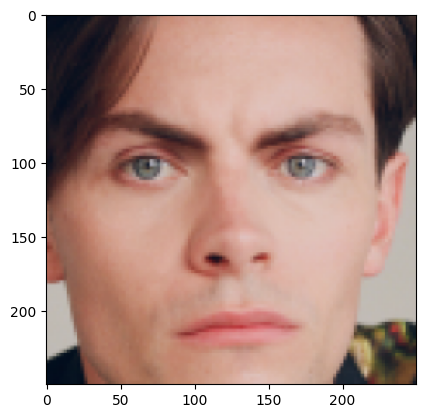

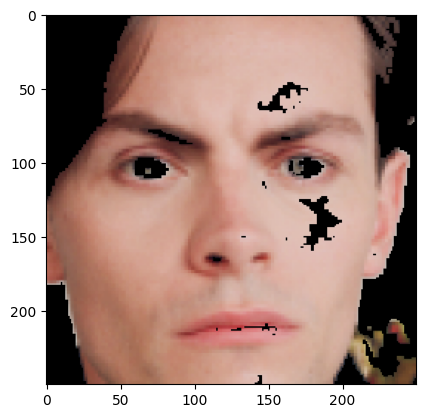

Color Information
Color Bar


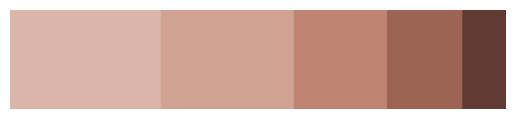

[{'cluster_index': 4,
  'color': [219.51397485178268, 181.74936477946687, 169.64453710339473],
  'color_percentage': 0.3058797969623353},
 {'cluster_index': 0,
  'color': [209.7925637445796, 162.33161878168946, 146.91226394297925],
  'color_percentage': 0.2674843475341194},
 {'cluster_index': 2,
  'color': [191.55403158769653, 132.52452202826314, 114.31369492934343],
  'color_percentage': 0.18838261144358198},
 {'cluster_index': 1,
  'color': [158.35837470603602, 100.55330546119708, 83.95218186569095],
  'color_percentage': 0.15133021271553002},
 {'cluster_index': 3,
  'color': [96.28639672429387, 59.5075068243864, 51.61624203821629],
  'color_percentage': 0.08692303134443326}]

In [49]:
skinextractor(freddyinput1)

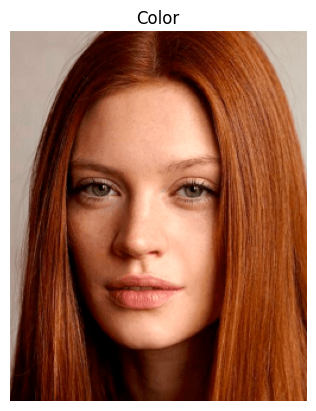

Found 1 faces!
face 0: [ 24  65 175 175]
the face that is probably a face is 0 with a size of 30625
Drawn! How does it do?


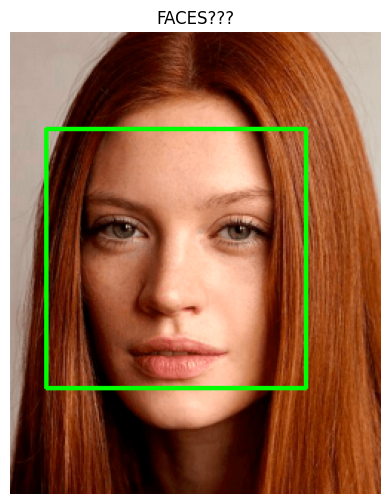

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


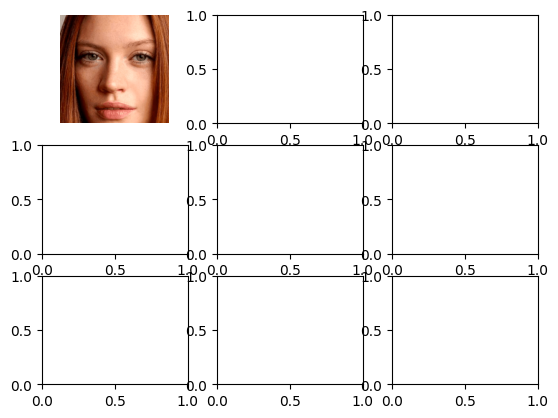

In [50]:
muted = facialrecognition("trueautumnwarm.png")

the min 0,max 232,the contrast*100 is 100.0


('clear', 100.0)

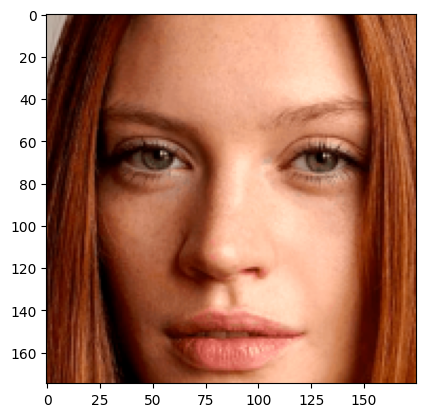

In [51]:
saturationtry3(muted)

# might have to change that ... 

## okay so that  didn't work :(

In [52]:
angelina = "https://m.media-amazon.com/images/M/MV5BODg3MzYwMjE4N15BMl5BanBnXkFtZTcwMjU5NzAzNw@@._V1_UY264_CR18,0,178,264_AL_.jpg"

In [53]:
pwd

'/Users/waverlywang/Documents/CS189/wcdataset'

# Test the file stuff 

In [54]:
pwd

'/Users/waverlywang/Documents/CS189/wcdataset'

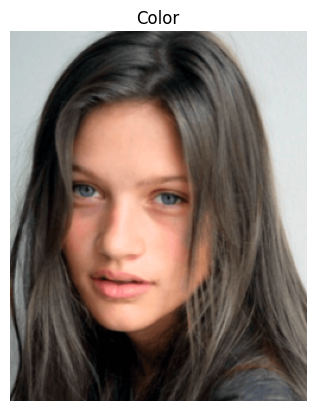

Found 1 faces!
face 0: [ 20  86 148 148]
the face that is probably a face is 0 with a size of 21904
Drawn! How does it do?


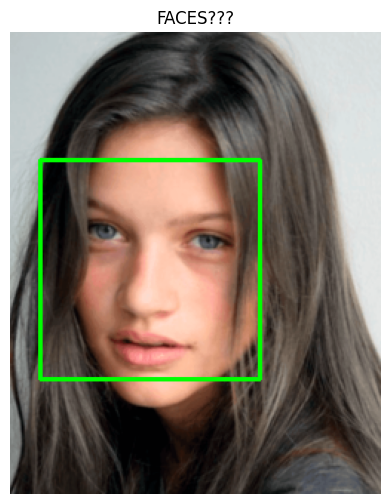

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


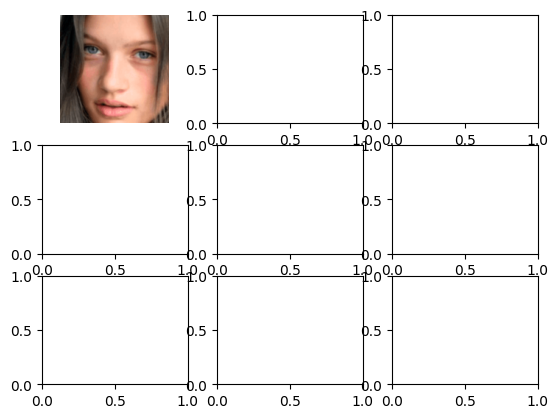

In [55]:
coolsummer = facialrecognition("truesummercool.png")


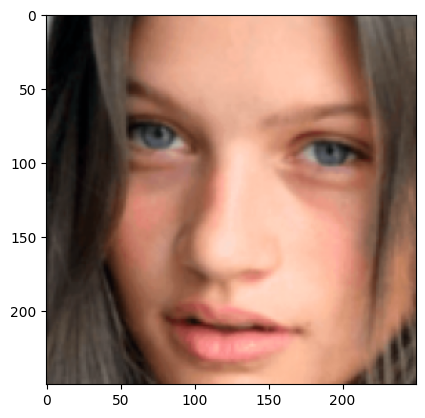

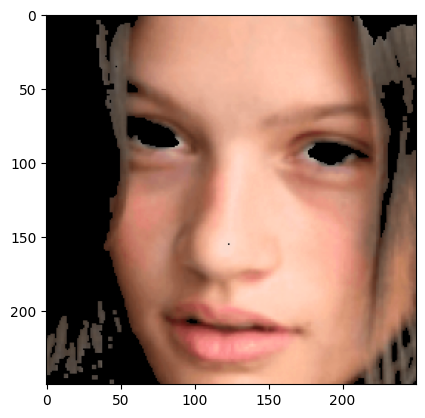

Color Information
Color Bar


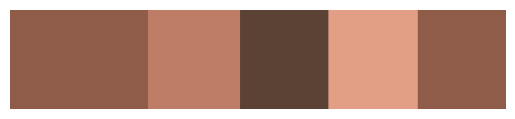

[{'cluster_index': 0,
  'color': [142.19269448618655, 92.40792971910788, 72.02670211536243],
  'color_percentage': 0.27979806271548185},
 {'cluster_index': 2,
  'color': [188.52233223322446, 124.78965896589699, 101.64180418041813],
  'color_percentage': 0.18537596453784272},
 {'cluster_index': 4,
  'color': [92.72576722640542, 66.41517081644426, 53.57614360162114],
  'color_percentage': 0.1786652438023313},
 {'cluster_index': 3,
  'color': [227.8917336394963, 158.4688863375422, 134.55246842709485],
  'color_percentage': 0.17837793465769167},
 {'cluster_index': 0,
  'color': [142.19269448618655, 92.40792971910788, 72.02670211536243],
  'color_percentage': 0.17778279428665245}]

In [56]:
skinextractor(coolsummer)

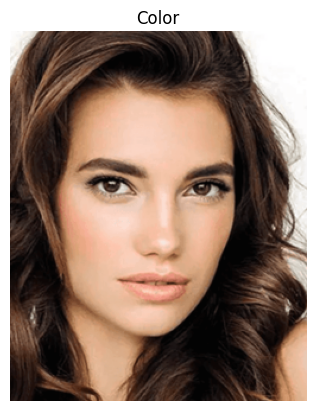

Found 1 faces!
face 0: [ 37  64 176 176]
the face that is probably a face is 0 with a size of 30976
Drawn! How does it do?


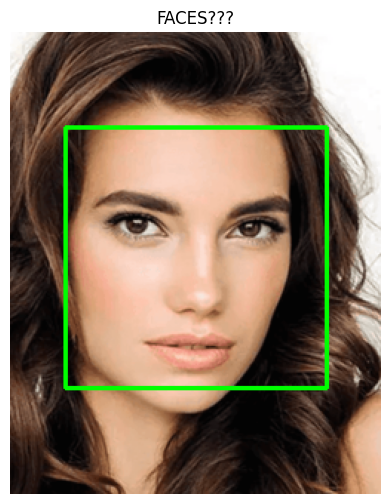

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


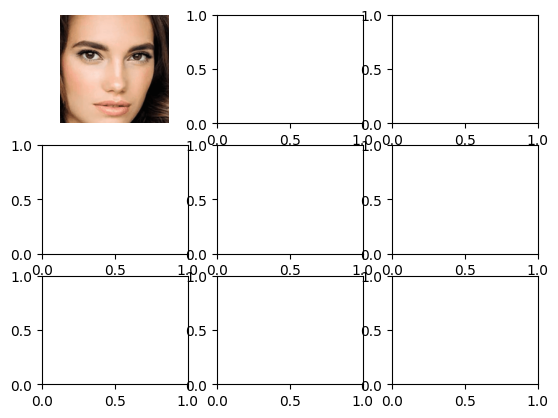

In [57]:
darkautumn = facialrecognition("darkautumnwarm.png")

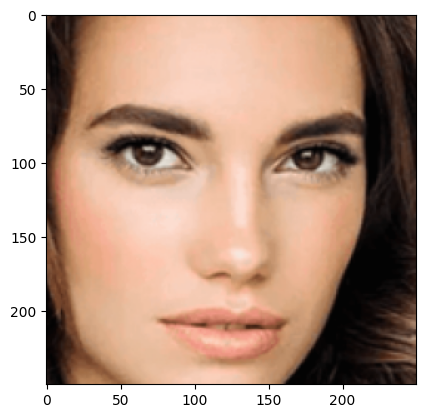

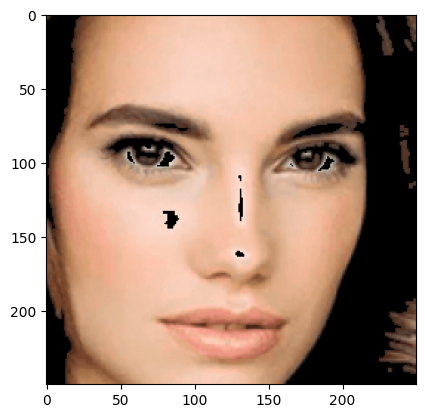

Color Information
Color Bar


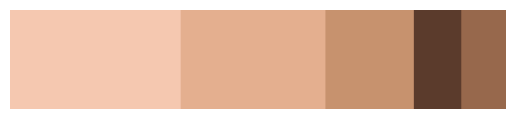

[{'cluster_index': 2,
  'color': [245.34481743227332, 200.45647820966087, 176.86519434629082],
  'color_percentage': 0.345164044395658},
 {'cluster_index': 0,
  'color': [228.91380269931727, 175.91484625017458, 143.57875330457776],
  'color_percentage': 0.2913973248770175},
 {'cluster_index': 3,
  'color': [199.09707522476333, 146.64242631159635, 110.92340958233756],
  'color_percentage': 0.17916819124283448},
 {'cluster_index': 4,
  'color': [91.13964823055672, 59.677474041110244, 44.0002119093028],
  'color_percentage': 0.09621092003089808},
 {'cluster_index': 1,
  'color': [151.0140552995392, 104.93087557603675, 76.45852534562228],
  'color_percentage': 0.0880595194535919}]

In [58]:
skinextractor(darkautumn)

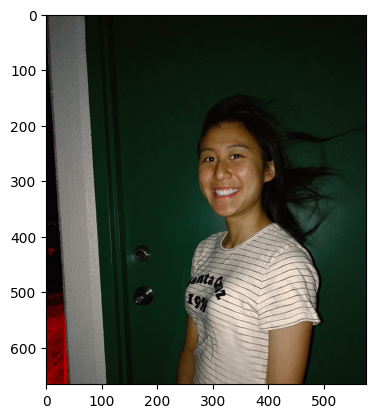

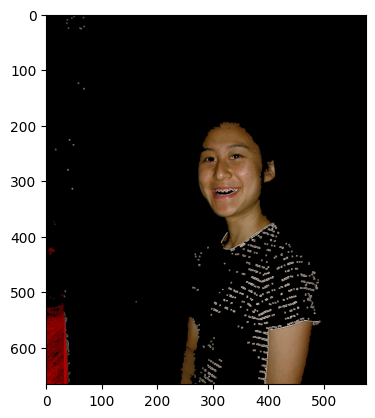

Color Information
Color Bar


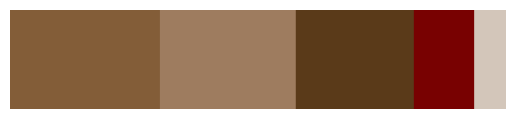

[{'cluster_index': 4,
  'color': [131.75967968298352, 93.03863617600426, 56.50532485759102],
  'color_percentage': 0.30225481392796566},
 {'cluster_index': 0,
  'color': [158.55666364460112, 124.84369900271287, 95.9417951042576],
  'color_percentage': 0.27499251721041607},
 {'cluster_index': 1,
  'color': [90.60151165232227, 58.62576107495305, 25.309363846315932],
  'color_percentage': 0.23770328245036415},
 {'cluster_index': 3,
  'color': [120.87497462959178, 1.6121372031664505, 1.3541708950677807],
  'color_percentage': 0.1228923476005188},
 {'cluster_index': 2,
  'color': [211.03806089743787, 198.68870192307435, 186.54246794871665],
  'color_percentage': 0.06215703881073531}]

In [59]:
skinextractor("4BetterImages-After.jpg")

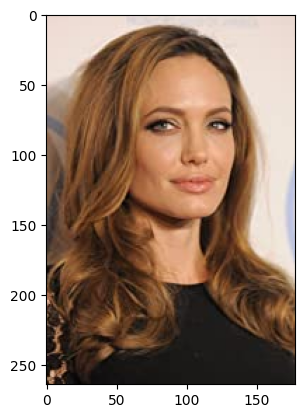

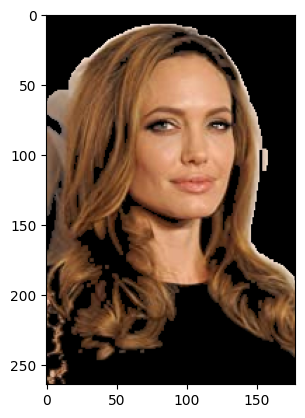

Color Information
Color Bar


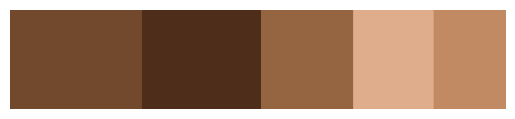

[{'cluster_index': 3,
  'color': [114.39685039370049, 73.35918635170579, 45.2640419947507],
  'color_percentage': 0.2663758530922395},
 {'cluster_index': 2,
  'color': [78.49912203687451, 46.91191103306992, 26.95654082528501],
  'color_percentage': 0.2406951382537114},
 {'cluster_index': 0,
  'color': [149.69401288366817, 100.6392572944296, 65.21447517999215],
  'color_percentage': 0.18651938366284387},
 {'cluster_index': 1,
  'color': [224.43936077057634, 173.47548161120883, 140.4660683012273],
  'color_percentage': 0.16161260817561388},
 {'cluster_index': 4,
  'color': [193.65899175957247, 138.23267086766847, 99.83688802714553],
  'color_percentage': 0.14479701681559137}]

In [60]:
skinextractor(angelina)

In [61]:
numpyangelina =  imutils.url_to_image(angelina)

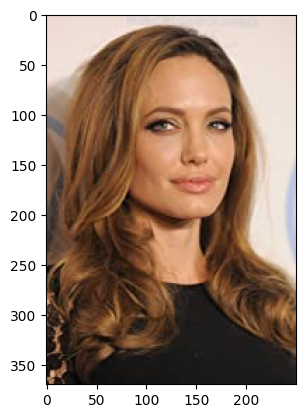

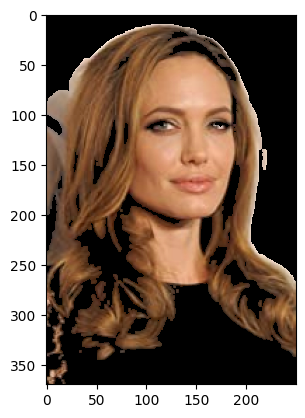

Color Information
Color Bar


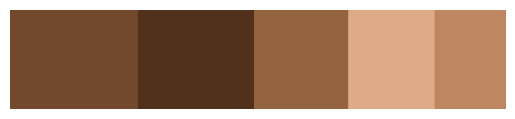

[{'cluster_index': 2,
  'color': [114.83674926801427, 73.65107476969307, 45.385845890166436],
  'color_percentage': 0.25907663896583566},
 {'cluster_index': 3,
  'color': [82.08079532902009, 49.538740729051995, 28.87359949502912],
  'color_percentage': 0.23418282548476455},
 {'cluster_index': 0,
  'color': [148.01465877099173, 99.11319289389428, 63.64459761188183],
  'color_percentage': 0.18930747922437674},
 {'cluster_index': 1,
  'color': [223.0384902441588, 170.79646017699295, 136.78942317944419],
  'color_percentage': 0.1739612188365651},
 {'cluster_index': 4,
  'color': [190.7722314897958, 135.5587065315023, 97.2149364814557],
  'color_percentage': 0.143471837488458}]

In [62]:
skinextractor(numpyangelina)

# calculate the value

In [63]:
def darkorlight1(numpyarray):
    # something that takes in the face and averages the value channel 
    
    # img =  imutils.url_to_image(fileurl)

    # Resize image to a width of 250
    numpyarray= imutils.resize(numpyarray,width=250)

    #Show image
    plt.imshow(cv2.cvtColor(numpyarray,cv2.COLOR_BGR2RGB))
    plt.show()

    img_hsv = cv2.cvtColor(numpyarray, cv2.COLOR_BGR2HSV)
    value = img_hsv[:, :, 2].mean() #mean of the second channel which is value
    halfwaybt80and255 = (80+255)/2
    xmin = 80
    xmax = 255
    normalizedvalue = ((value)-xmin)/(xmax-xmin)
    if 80 < value and value < halfwaybt80and255: #you are dark if you have low value 
        print("dark, the weighted avg value", {value}, "the normalized value", {value*100})
        return "dark", normalizedvalue*100

    elif value > halfwaybt80and255:
        print("light, the weighted avg value", {value}, "the normalized value",{value*100})
        return "light", normalizedvalue*100
    # dominant_colors = extractDominantColor(numpyarray,number_of_colors=5,hasThresholding=False)

# Try this out... 

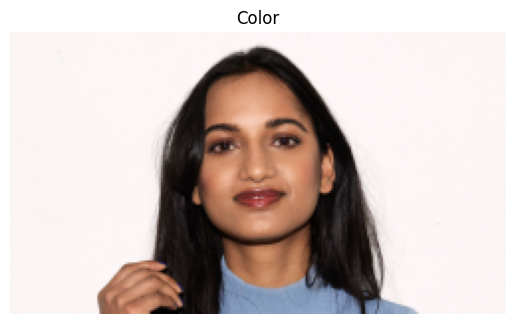

Found 1 faces!
face 0: [85 26 79 79]
the face that is probably a face is 0 with a size of 6241
Drawn! How does it do?


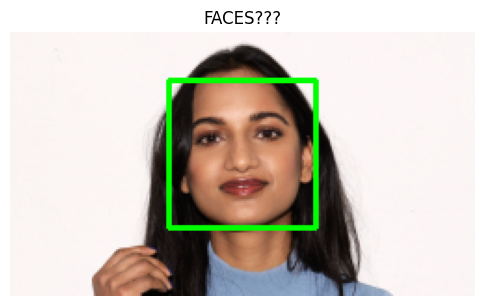

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


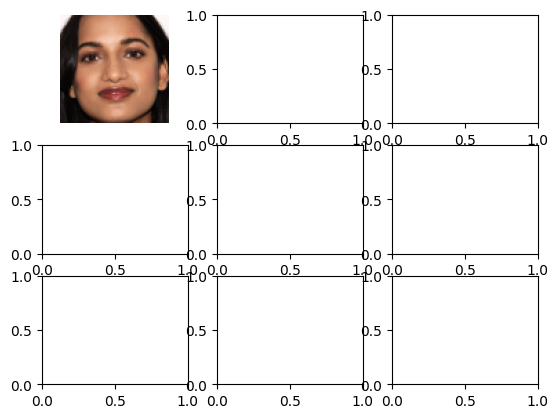

In [64]:
amita = facialrecognition("https://d26oc3sg82pgk3.cloudfront.net/files/media/edit/image/43291/article_full%401x.png")

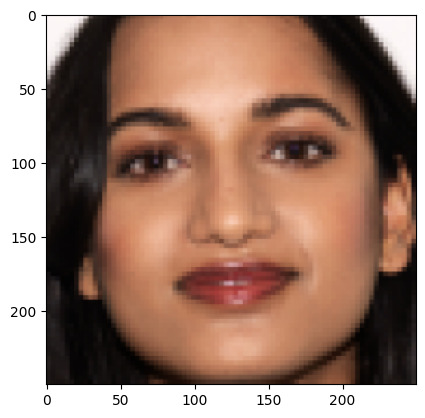

dark, the weighted avg value {134.454704} the normalized value {13445.470399999998}


('dark', 31.116973714285713)

In [65]:
darkorlight1(amita)



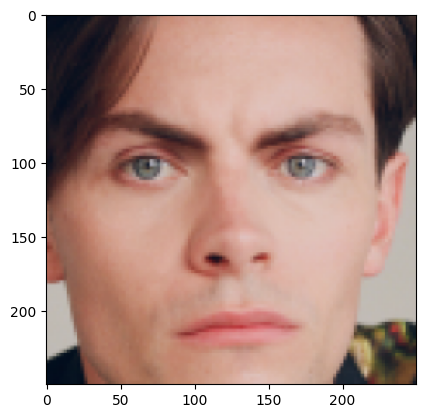

light, the weighted avg value {173.439136} the normalized value {17343.9136}


('light', 53.393792)

In [66]:
darkorlight1(freddyinput1)

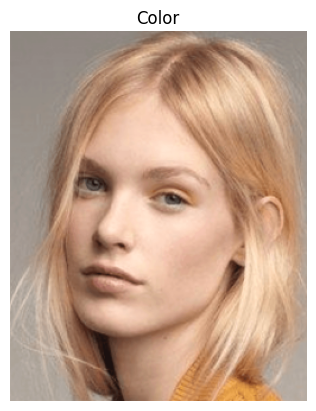

Found 1 faces!
face 0: [ 15  69 170 170]
the face that is probably a face is 0 with a size of 28900
Drawn! How does it do?


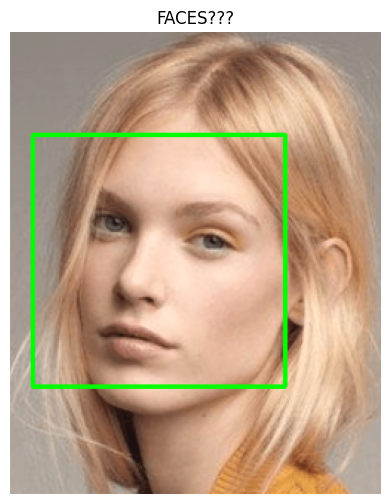

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


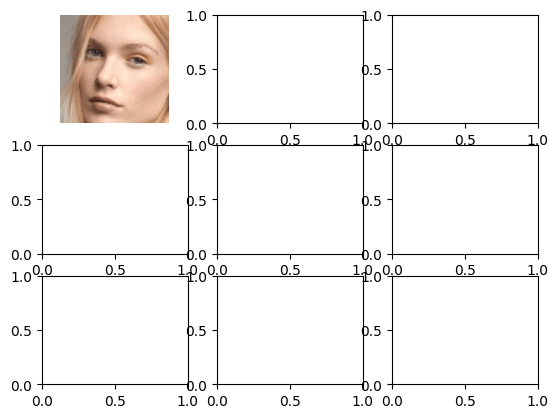

In [67]:
spring = facialrecognition("lightspringwarm.png")

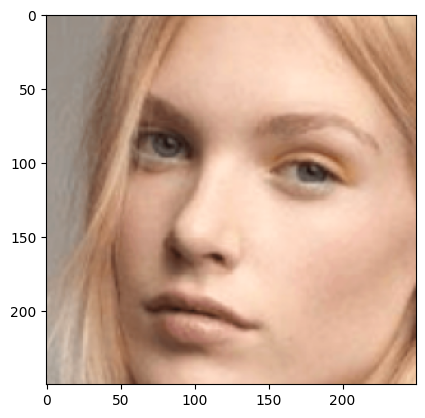

light, the weighted avg value {200.249984} the normalized value {20024.9984}


('light', 68.71427657142858)

In [68]:
darkorlight1(spring)

## lol this is def not working...I'll try again

In [69]:
def darkorlight2(numpyarray):
    # something that takes in the face and averages the value channel 
    
    # img =  imutils.url_to_image(fileurl)
    # Resize image to a width of 250
    numpyarray= imutils.resize(numpyarray,width=250)
    
    #Show image
    plt.imshow(cv2.cvtColor(numpyarray,cv2.COLOR_BGR2RGB))
    plt.show()
    # Resize image to a width of 250
  
    color_info = extractDominantColor(numpyarray,number_of_colors=5,hasThresholding=False)
    #Show in the dominant color information
    print("Color Information")
    prety_print_data(color_info)


    #Show in the dominant color as bar
    print("Color Bar")
    colour_bar = plotColorBar(color_info)
    plt.axis("off")
    plt.imshow(colour_bar)
    plt.show()

    sum = 0
    for info in color_info:
        r,g,b = info["color"]
        percent = info["color_percentage"]
        h,s,v = colorsys.rgb_to_hsv(r,g,b)
        print(h,s,v, "hue")
        sum += v*percent
    weightedavgvalue = sum 
    
    
    # from the extract skin function I realized that 80 - 255 is the
    # halfway between 80 and 255 is (80+255)/2
    halfwaybt80and255 = (80+255)/2

    xmin= 80
    xmax = 255
    normalizedvalue = ((weightedavgvalue)-xmin)/(xmax-xmin)
    
    if 80 < weightedavgvalue and weightedavgvalue < halfwaybt80and255: #you are dark if you have low value 
        print("dark, the weighted avg value", {weightedavgvalue}, "the normalized value", {normalizedvalue*100})
        return "dark", normalizedvalue*100

    elif weightedavgvalue > halfwaybt80and255:
        print("light, the weighted avg value", {weightedavgvalue}, "the normalized value",{normalizedvalue*100})
        return "light", normalizedvalue*100

      




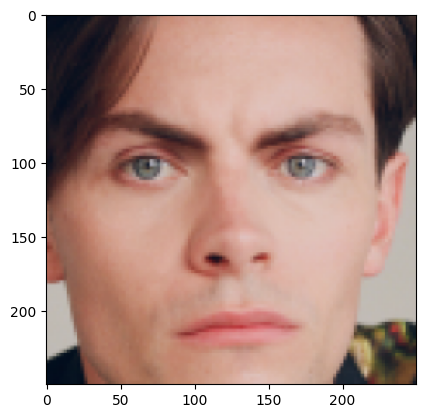

Color Information
{'cluster_index': 4,
 'color': [214.42677544965548, 178.6900055627671, 166.44168366400734],
 'color_percentage': 0.432288}

{'cluster_index': 1,
 'color': [199.71430789534952, 145.723856843413, 128.56253396475432],
 'color_percentage': 0.205728}

{'cluster_index': 2,
 'color': [165.82494887525567, 108.3197341513289, 91.15092024539773],
 'color_percentage': 0.156064}

{'cluster_index': 3,
 'color': [35.83139612558287, 28.755377421511582, 35.03473613894306],
 'color_percentage': 0.119568}

{'cluster_index': 0,
 'color': [101.52069029504466, 65.20356281313659, 55.94451660790382],
 'color_percentage': 0.086352}

Color Bar


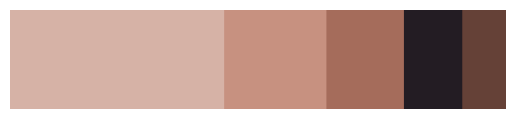

0.042542108541661405 0.2237831151684431 214.42677544965548 hue
0.04019886394633587 0.35626778411829557 199.71430789534952 hue
0.03831946711359994 0.4503184179241485 165.82494887525567 hue
0.8520976512348071 0.19748096555520922 35.83139612558287 hue
0.0338592348302858 0.44893482850328353 101.52069029504466 hue
light, the weighted avg value {172.7110548818444} the normalized value {52.97774564676823}


('light', 52.97774564676823)

In [70]:
darkorlight2(freddyinput1)

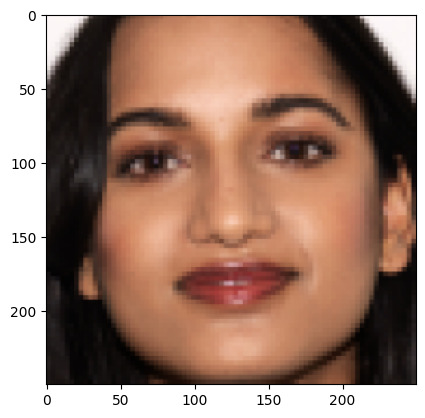

Color Information
{'cluster_index': 4,
 'color': [175.1756764422265, 114.93493675194222, 86.55737704918027],
 'color_percentage': 0.281952}

{'cluster_index': 3,
 'color': [23.180381904975377, 17.015003409868527, 15.274153216641409],
 'color_percentage': 0.281664}

{'cluster_index': 2,
 'color': [213.92268694549995, 152.4681875792163, 119.43479087452589],
 'color_percentage': 0.252096}

{'cluster_index': 0,
 'color': [107.52558886509685, 66.48297644539574, 52.2440042826552],
 'color_percentage': 0.149936}

{'cluster_index': 1,
 'color': [244.70672853828367, 226.99071925754305, 220.58979118329444],
 'color_percentage': 0.034352}

Color Bar


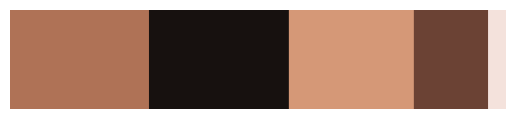

0.0533703909484499 0.5058824443716238 175.1756764422265 hue
0.03669786320490637 0.3410741341857269 23.180381904975377 hue
0.058267422033748406 0.441691797256858 213.92268694549995 hue
0.04292861800269702 0.5141249182257325 107.52558886509685 hue
0.04423535750020935 0.09855445127744498 244.70672853828367 hue
dark, the weighted avg value {134.37738733215866} the normalized value {31.07279276123352}


('dark', 31.07279276123352)

In [71]:
darkorlight2(amita)

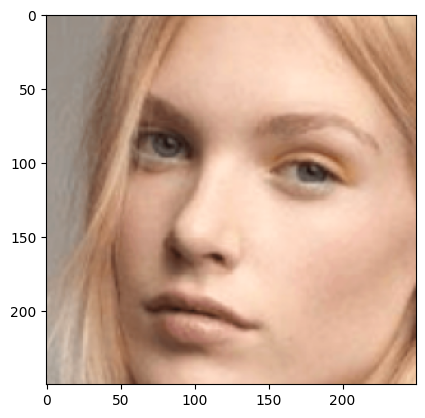

Color Information
{'cluster_index': 1,
 'color': [221.00380574614104, 177.9173456260717, 152.29604416809644],
 'color_percentage': 0.29872}

{'cluster_index': 0,
 'color': [177.63250062766767, 144.73455937735332, 123.56264122520756],
 'color_percentage': 0.254624}

{'cluster_index': 3,
 'color': [248.54725260331594, 211.1091754535355, 188.39354247167307],
 'color_percentage': 0.244608}

{'cluster_index': 4,
 'color': [153.06261510128928, 111.95980933809973, 88.06878994691851],
 'color_percentage': 0.147456}

{'cluster_index': 2,
 'color': [103.91178194607348, 69.93874560375198, 54.466588511137644],
 'color_percentage': 0.054592}

Color Bar


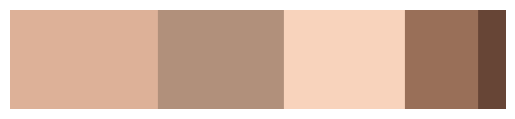

0.062150429756207916 0.31088949507487973 221.00380574614104 hue
0.06526099872190676 0.30439170315906877 177.63250062766767 hue
0.06293774435566983 0.24202122333514114 248.54725260331594 hue
0.061264844094640815 0.4246224665073249 153.06261510128928 hue
0.05215254850124753 0.47583818224382035 103.91178194607348 hue
light, the weighted avg value {200.28715402947415} the normalized value {68.73551658827094}


('light', 68.73551658827094)

In [72]:
darkorlight2(spring)

## okay tunrns out that low value is DARK huh never knew looks like both of these work well. 

## warm and cool below!

In [73]:
from numpy.ma.extras import average
def warmorcool(numpyarray):
  #takes in an numpyarray and outputs whether the value is warm or cool or neutral based on amount of r or b
  # if the red == blue it is neutral
  # if the amount of red > blue it is warm
  # also return a score: Which is 0 for cool and 10 for warm. 
  # in this case we take (avgb - avgr)/255*10


  colorinfo = skinextractor(numpyarray) #can take in url, numpy array, or image! but we'll do numpy array
  totalred = 0
  totalblue = 0
  totalcolors = len(colorinfo)
  for info in colorinfo:
    r,g,b = info["color"]
    totalred += r
    totalblue += b
  avgr = totalred/totalcolors
  avgb = totalblue/totalcolors
  score = (abs(avgb - avgr)/255)*10
  hue = ""
  if avgr > avgb:

    hue = "warm"
  elif avgb > avgr:
    hue = "cool"
  else:
    hue = "neutral"
  return hue, score

## try to get skin color

In [74]:
def getskincolor(numpyarray):
    #given a numpy array get skin color

    
    numpyarray= imutils.resize(numpyarray,width=250)
    
    #Show image
    # plt.imshow(cv2.cvtColor(numpyarray,cv2.COLOR_BGR2RGB))
    # plt.show()
    # Resize image to a width of 250

    color_info = skinextractor(numpyarray)
    #Show in the dominant color information
    # print("Color Information")
    # prety_print_data(color_info)


    #Show in the dominant color as bar
    # print("Color Bar")
    # colour_bar = plotColorBar(color_info)
    # plt.axis("off")
    # plt.imshow(colour_bar)
    # plt.show()

    # sum = 0
    r,g,b = color_info[0]["color"]    #just choose the dominant color 
    percent = color_info[0]["color_percentage"]
    h,s,v = colorsys.rgb_to_hsv(r,g,b)
    # look at the value v not the hue
    
    # sum += v*percent
    # weightedavgvalue = sum #average of the 5 dominant colors
    #80 is the min 255 is the max. 
    # take this and output skin color
 
    if v >= 236:
        return "fair", (h,s,v)
    elif 225 <= v < 236:
        return "light", (h,s,v)
    elif 201 <= v < 225: 
        return "medium", (h,s,v)
    elif 130 <= v< 201: 
        return "tan", (h,s,v)
    elif 116 <= v < 130:
        return "dark"
    elif v < 116:
        return "deep", (h,s,v)

In [75]:
type(freddyinput1)

numpy.ndarray

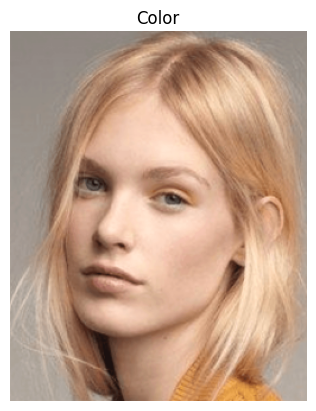

Found 1 faces!
face 0: [ 15  69 170 170]
the face that is probably a face is 0 with a size of 28900
Drawn! How does it do?


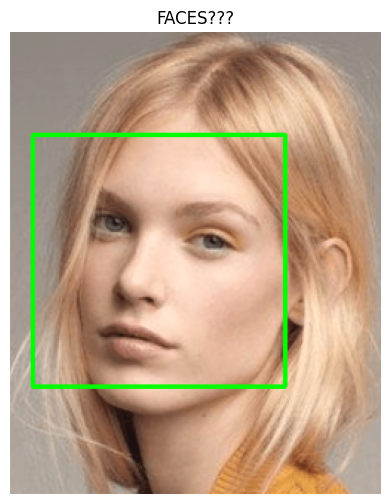

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


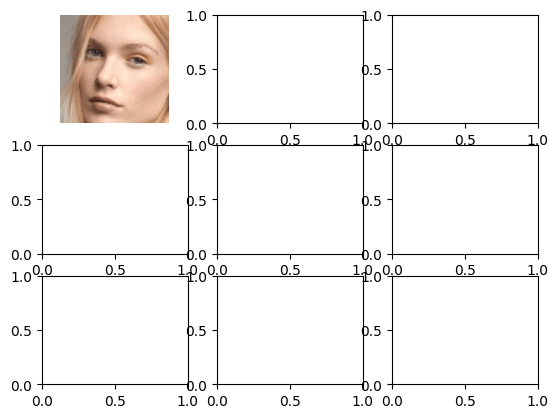

In [76]:
test1 = facialrecognition("lightspringwarm.png")

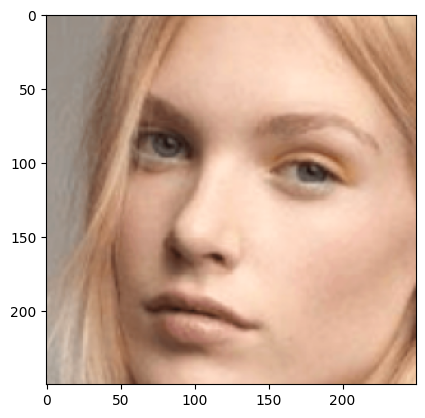

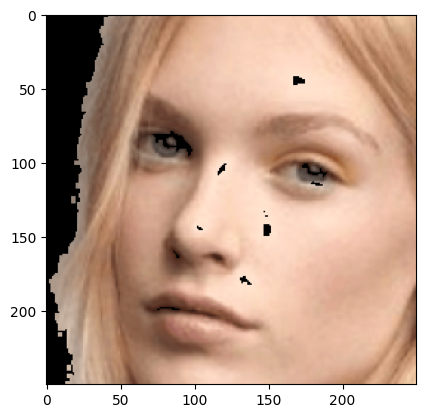

Color Information
Color Bar


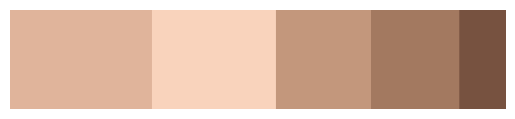

('medium', (0.061503451739959435, 0.31035334030757855, 224.99945004582924))

In [77]:
getskincolor(test1)

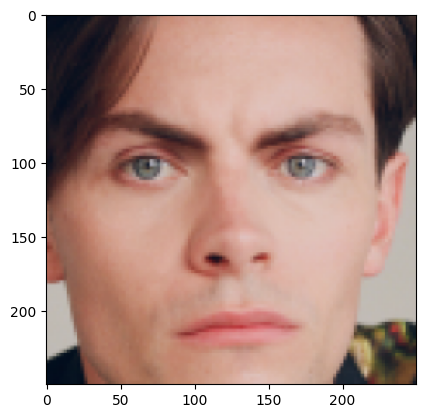

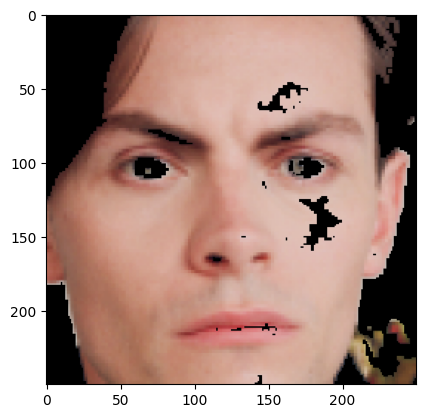

Color Information
Color Bar


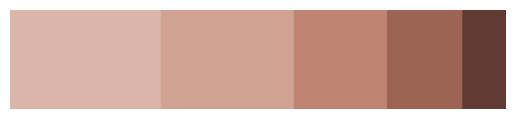

('medium', (0.0404550636709469, 0.22718115227998642, 219.51397485178268))

In [78]:
getskincolor(freddyinput1)

# THE MINS AND MAX WARM AND COOL VALUES
the min and max warm hue value of fair skin is 0.06439393939393939 - 0.11190476190476191

the min and max cool hue value of fair skin is 0.06439393939393939 - 0.07407407407407407

the min and max value of fair skin is 236 - 253


the min and max warm hue value of light skin is 0.07647058823529412 - 0.11190476190476191

the min and max cool hue value of light skin is 0.09408602150537633 - 0.0966183574879227

the min and max value of light skin is 130 - 236


the min and max warm hue value of med skin is 0.07017543859649122 - 0.08934707903780069

the min and max cool hue value of med skin is 0.0641025641025641 - 0.07028112449799197

the min and max value of medium skin is 130 - 225


the min and max warm hue value of tan skin is 0.05092592592592593 - 0.07647058823529412

the min and max cool hue value of tan skin is 0.05092592592592593 - 0.06481481481481481

the min and max value of tan skin is 130 - 201


the min and max warm hue value of dark skin is 0.03125 - 0.07647058823529412

the min and max cool hue value of dark skin is 0.0 - 0.027272727272727282

the min and max value of dark skin is 116 - 132


the min and max warm hue value of deep skin is 0.027131782945736427 - 0.07246376811594203

the min and max cool hue value of deep skin is 0.009803921568627453 - 0.9696969696969697

the min and max value of deep skin is 73 - 90


# lower_threshold = np.array([0, 48, 80], dtype=np.uint8)
# upper_threshold = np.array([20, 255, 255], dtype=np.uint8)

In [79]:
def newwarmorcool(numpyarray):
    #takes in numpyarray and then outputs if it's warm or cool for the colors.
    skincolor, (h,s,v) = getskincolor(numpyarray)


    if skincolor == "fair":
        mincool = 0
        maxcool = .07
        minwarm = .07
        maxwarm = 20
    

        if h <= maxcool:
            print("you are cool for", skincolor, "skin")
            norm =  ((h)-mincool)/(maxcool-mincool)
            print(1-norm, "cool")
            return 1-norm, "cool"

        elif h > maxcool:
            print("you are warm for ", skincolor, "skin") # have to create a range within 0 and 20. tear tear
            norm =  ((h)-minwarm)/(maxwarm-minwarm)
            print(norm, "cool")
            return norm, "cool" #how far is it from the divide between warm and cool?
    

    elif skincolor == "light":
        mincool = .97
        maxcool = 20
        minwarm = 0
        maxwarm = .97
        if h <= maxwarm:
            print("you are warm for ", skincolor, "skin")
            norm =  ((h)-minwarm)/(maxwarm-minwarm)
            print(1-norm, "warm")
            return 1-norm, "warm"

        elif h > maxwarm:
            print("you are cool for", skincolor, " skin") # have to create a range within 0 and 20. tear tear
            norm =  ((h)-mincool)/(maxcool-mincool)
            print(norm, "cool")
            return norm, "cool" #how far is it from the divide between warm and cool?
    
        
    elif skincolor == "medium":
        mincool = 0
        maxcool = .07
        minwarm = .07
        maxwarm = 20
    

        if h <= maxcool:
            print("you are cool for ", skincolor, "skin")
            norm =  ((h)-mincool)/(maxcool-mincool)
            print(1-norm, "cool")
            return 1-norm, "cool"

        elif h > maxcool:
            print("you are warm for ", skincolor, "skin") # have to create a range within 0 and 20. tear tear
            norm =  ((h)-minwarm)/(maxwarm-minwarm)
            return norm, "warm" #how far is it from the divide between warm and cool?
    elif skincolor == "tan":
        mincool = 0
        # maxcool = .06
        # minwarm = .06
        maxwarm = 20
    
        # if h <= maxcool:
        #     print("you are cool for ", skincolor, "skin")
        #     norm =  ((h)-mincool)/(maxcool-mincool)
        #     print(1-norm, "cool")
        #     return 1-norm, "cool"

        # elif h > maxcool:
        #     print("you are warm for ", skincolor, " skin") # have to create a range within 0 and 20. tear tear
        #     norm =  ((h)-minwarm)/(maxwarm-minwarm)
        #     print(norm, "warm" )
        #     return norm, "warm" #how far is it from the divide between warm and cool?
        return ((h)-mincool)/(maxwarm-mincool), "warm"
    elif skincolor == "dark":
        mincool = 0
        maxcool = .027
        minwarm = .027
        maxwarm = 20
    
        if h <= maxcool:
            print("you are cool for ", skincolor, "skin")
            norm =  ((h)-mincool)/(maxcool-mincool)
            print(1-norm, "cool")
            return 1-norm, "cool"

        elif h > maxcool:
            print("you are warm for ", skincolor, " skin") # have to create a range within 0 and 20. tear tear
            norm =  ((h)-minwarm)/(maxwarm-minwarm)
            print(norm, "warm" )
            return norm, "warm" #how far is it from the divide between warm and cool?
    elif skincolor == "deep":
        mincool = 0
        maxcool = .96
        minwarm = .96
        maxwarm = 20
    
        if h <= maxcool:
            print("you are cool for ", skincolor, "skin")
            norm =  ((h)-mincool)/(maxcool-mincool)
            print(1-norm,"cool")
            return 1-norm,"cool"

        elif h > maxcool:
            print("you are warm for ", skincolor, " skin") # have to create a range within 0 and 20. tear tear
            norm =  ((h)-minwarm)/(maxwarm-minwarm)
            print(norm, "warm" )
            return norm, "warm" #how far is it from the divide between warm and cool?
    
    
    
    
    



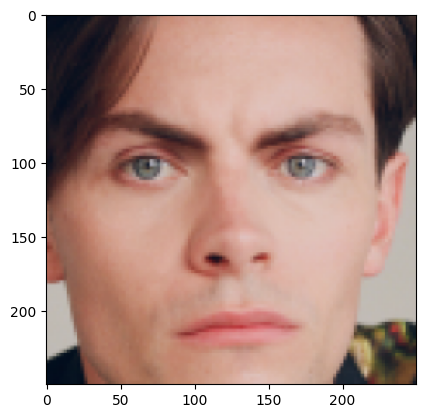

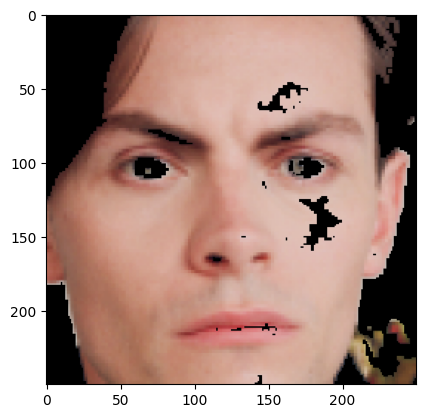

Color Information
Color Bar


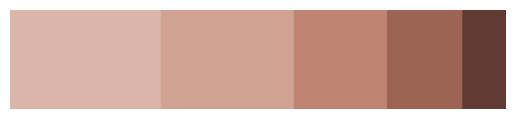

you are cool for  medium skin
0.42207051898647285 cool


(0.42207051898647285, 'cool')

In [80]:
newwarmorcool(freddyinput1)

In [81]:
def newdarkorlight(numpyarray):


     #calls skin colors
    skincolor, (h,s,v) = getskincolor(numpyarray)
    print("This person has", skincolor, "skin")
    if skincolor == "fair" or skincolor == "light": #fair or light... are always light and see how light they are
        if skincolor == "fair":
    
            minv = 236 #dark 
            maxv = 255 #light

        elif skincolor == "light":
            minv = 225 
            maxv = 236
        normalizedvalue = ((v)-minv)/(maxv-minv)
    
        # return how much of a fair person are they?
        print(normalizedvalue, "light")
        return normalizedvalue, "light" #the amount that it's light. the greater it is the more light it is



    elif skincolor == "medium" or skincolor == "tan" : #tan or medium people can be dark or light for their skin tone. 
        if skincolor == "medium":
            minv = 201
            maxv = 224
        elif skincolor == "tan":
            minv = 130
            maxv = 201
        halfway = (minv + maxv)/2
        if v >= minv and v <= halfway: 
            normalizedvalue = ((v)-minv)/(halfway-minv)
            # if you're halfway is the maxvalue... then we want to measure how far away are you from halfway instead of distance from inv so do 1-halfway
            print("this person is dark for ", skincolor, "skin")
            print(1- normalizedvalue, "dark")
            return 1- normalizedvalue, "dark"

        elif v > halfway and v <= maxv:
            normalizedvalue = ((v)-halfway)/(maxv-halfway)
            print("this person is light for ", skincolor, "skin")
            print(normalizedvalue, "light")
            return normalizedvalue, "light"

     
    elif skincolor == "dark" or "deep": #deep and dark can be only dark. 
        if skincolor == "dark":
            minv =  116
            maxv =  130
        elif skincolor == "deep":
            minv = 116
            maxv = 80
        normalizedvalues = ((v-minv)/(maxv-minv))
        print(1-normalizedvalues, "dark")
        return 1-normalizedvalues, "dark" #1 - because low values are dark
  
        
 
        
    # if v >= 236:
    #     return "fair", (h,s,v)
    # elif 225 <= v < 236:
    #     return "light", (h,s,v)
    # elif 201 <= v < 225: 
    #     return "medium", (h,s,v)
    # elif 130 <= v< 201: 
    #     return "tan", (h,s,v)
    # elif 116 <= v < 130:
    #     return "dark"
    # elif v < 116:
    #     return "deep", (h,s,v)

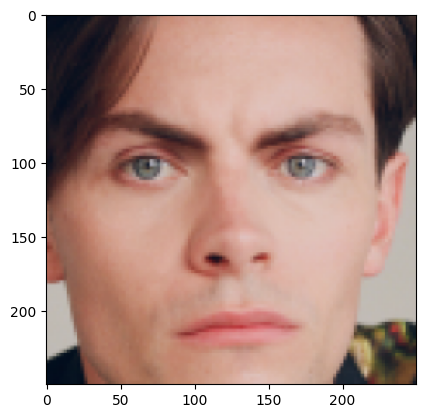

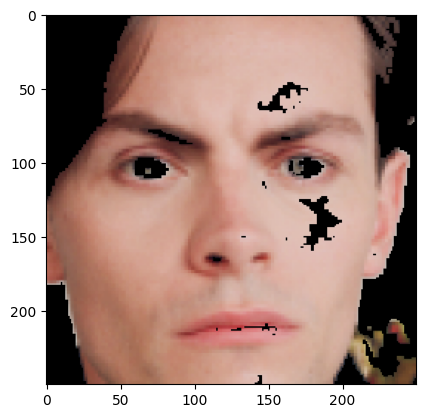

Color Information
Color Bar


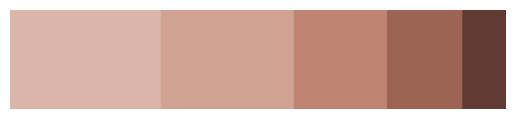

This person has medium skin
this person is light for  medium skin
0.6099108566767546 light


(0.6099108566767546, 'light')

In [82]:
newdarkorlight(freddyinput1)

In [83]:
import statistics
import math
from numpy import mean
def newclearorsoft(numpyarray):
    # given numpy array
    
    

    color_info = extractDominantColor(numpyarray,number_of_colors=5,hasThresholding=True)
    #Show in the dominant color information
    print(len(color_info))
    vlist = []
    whitelist = []
    for i in range(0,len(color_info)):
        r,g,b  = color_info[i]["color"]
        # percent = color_info[0]["color_percentage"]
        h,s,v = colorsys.rgb_to_hsv(r,g,b)

        if v >= 255-15 and v<= 255: 
            whitelist += [color_info[i]]

            
        # xbarw += percent*v
        # xbarw2 += percent*h
        if v != 255:
        # hlist += [h]
            vlist += [v]

    # for white in whitelist: # try without TODO: turn back later
    #     print("removing", white)
    #     color_info.remove(white)
    #     print(color_info, "yay")

    # sum = 0
    # hlist = []


    # xbarw = 0
    # xbarw2 = 0
    # n = 0 
    # sumw = 0
    # for color in color_info:
    #     r,g,b = color["color"]    #just choose the dominant color 
        # percent = color["color_percentage"]
        # if percent != 0:
        #     n +=1

        # sumw += percent

    # xbarw = xbarw/1 
    # calculating the standard deviation
    # w = 0 
    # for color in color_info:
    #     r,g,b = color["color"]   #just choose the dominant color 
    #     percent = color["color_percentage"]

    #     h,s,v = colorsys.rgb_to_hsv(r,g,b)
        # if v != 255: 
        #     numerator = percent*(v-xbarw)
        # # numerator2 = percent*(h-xbarw2)
        #     numerator = numerator**2
        #     stdw = math.sqrt(numerator/(sumw*(n-1)/n))

    # numerator2 = numerator2**2
    # stdw2 = math.sqrt(numerator2/(sumw*(n-1)/n))

    #Show in the dominant color as bar
    print("Color Bar")
    print(len(color_info), "after")
    colour_bar = plotColorBar(color_info)
    plt.axis("off")
    plt.imshow(colour_bar)
    plt.show()
   
    std1 = statistics.stdev(vlist)/mean(vlist)
    if std1 <= .47:
        min = 0
        max = .47
        value = (std1 - min)/(max-min)
        print(1-value, "soft")
        return 1-value, "soft" #most soft is 0 and least soft is .47
    elif std1 >= .47:
        min = .47
        max = 1
        value = (std1 - min)/(max-min) #least clear is .47 and most is 1
        print(value, "clear")
        return value, "clear"


    # std2 = statistics.stdev(hlist)/mean(hlist)
    # stdw/mean(xbarw) #weighted standard deviation of value"
    # # print(stdw2, "weighted standard deviation of hue")

     
  
  


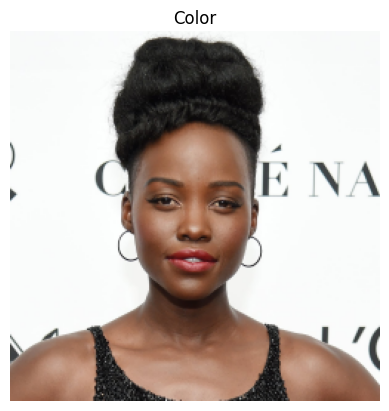

Found 1 faces!
face 0: [ 71  71 107 107]
the face that is probably a face is 0 with a size of 11449
Drawn! How does it do?


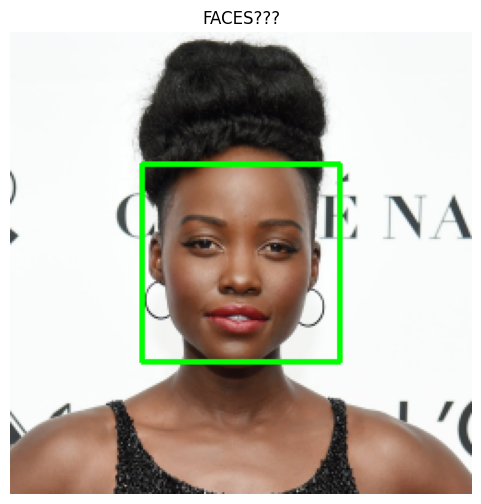

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


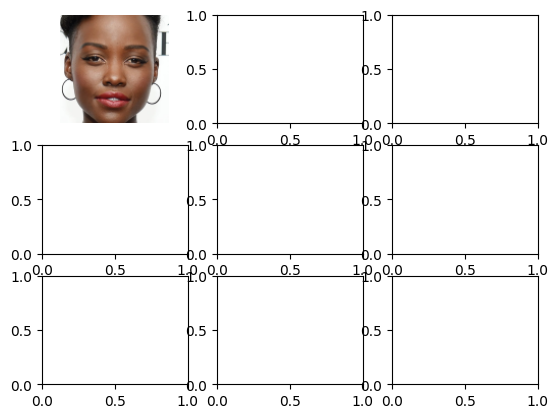

In [84]:
waverly = facialrecognition("https://i.guim.co.uk/img/media/b818cb19f1b8eefaab97ffdc6096cf1b1f3b102d/145_336_2861_1717/master/2861.jpg?width=1200&height=1200&quality=85&auto=format&fit=crop&s=31918e4ebbdef0b8ebeada5767ba5b99")

6
Color Bar
6 after


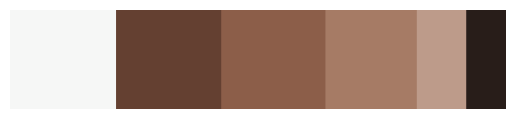

0.03157785428913946 clear


(0.03157785428913946, 'clear')

In [85]:
newclearorsoft(waverly)

In [86]:
pwd

'/Users/waverlywang/Documents/CS189/wcdataset'

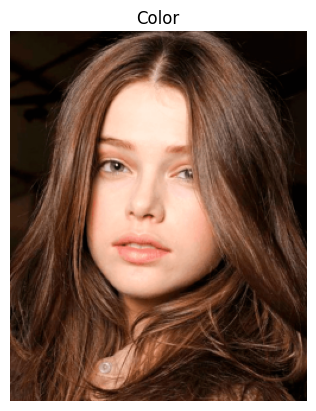

Found 3 faces!
face 0: [180  36  30  30]
face 1: [ 48  68 136 136]
face 2: [ 30  14 129 129]
the face that is probably a face is 1 with a size of 18496
Drawn! How does it do?


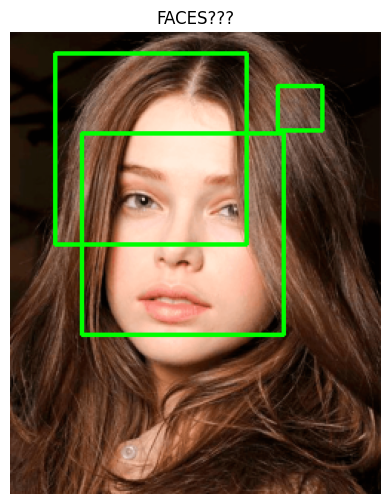

There are 3 faces detected - they are held in the list 'LoFi'
Here are some of them...


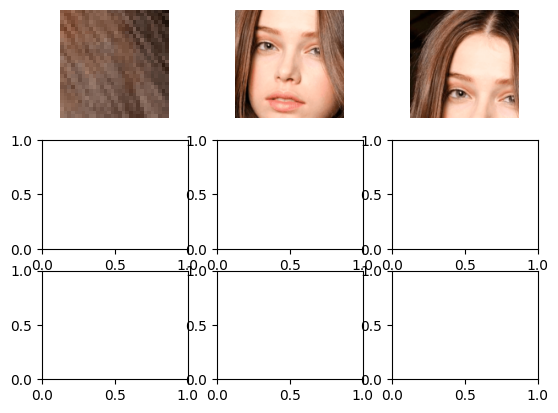

In [87]:
face = facialrecognition("softautumn.png")

6
Color Bar
6 after


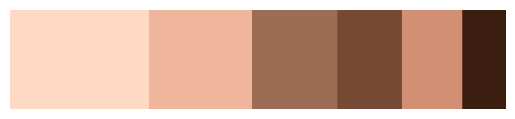

0.06864950078636478 soft


(0.06864950078636478, 'soft')

In [88]:
newclearorsoft(face)

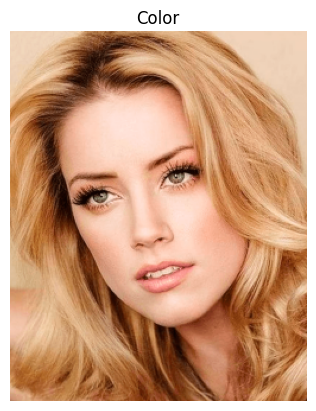

Found 1 faces!
face 0: [ 24  61 174 174]
the face that is probably a face is 0 with a size of 30276
Drawn! How does it do?


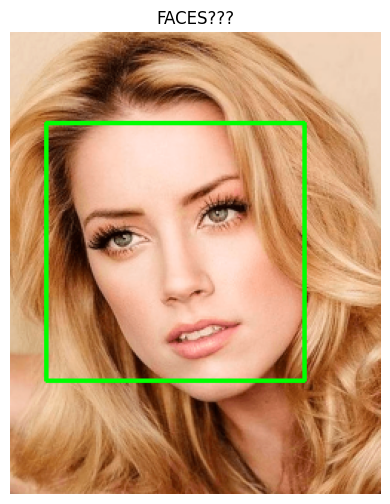

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


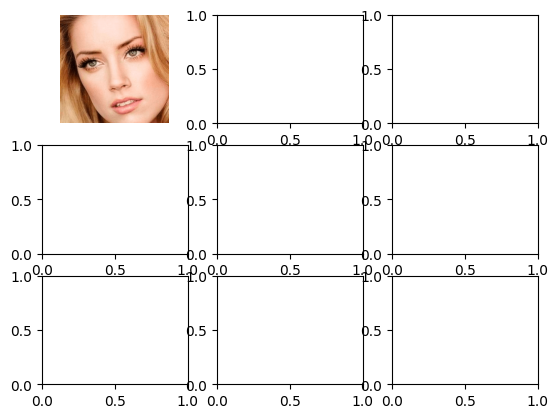

In [89]:
bright = facialrecognition("truespringwarm.png")

6
Color Bar
6 after


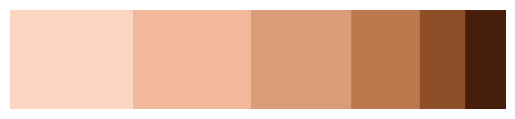

0.2106130305659697 soft


(0.2106130305659697, 'soft')

In [90]:
newclearorsoft(bright)

6
Color Bar
6 after


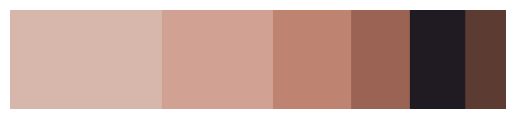

0.025819771306624006 clear


(0.025819771306624006, 'clear')

In [91]:
newclearorsoft(freddyinput1)

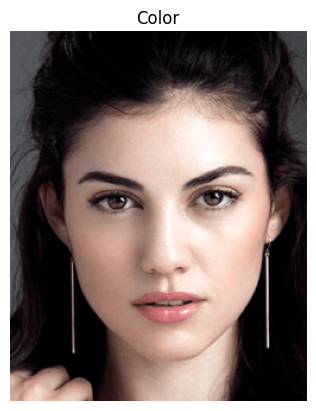

Found 1 faces!
face 0: [ 30  68 195 195]
the face that is probably a face is 0 with a size of 38025
Drawn! How does it do?


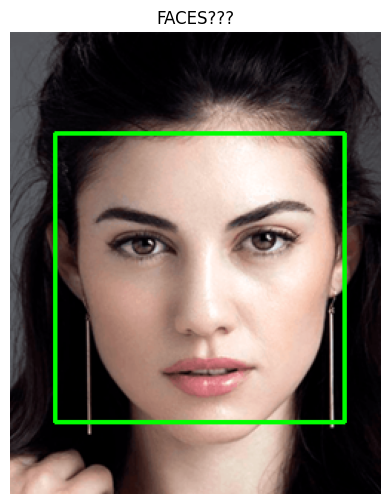

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


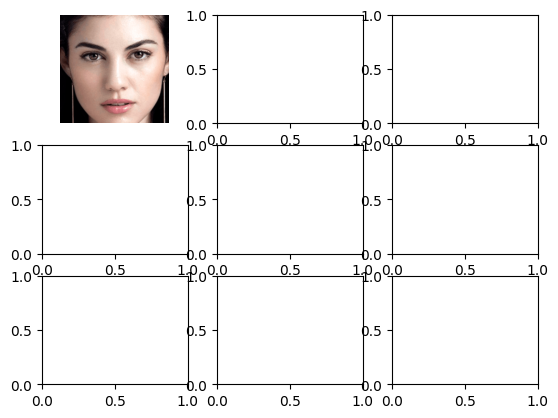

6
Color Bar
6 after


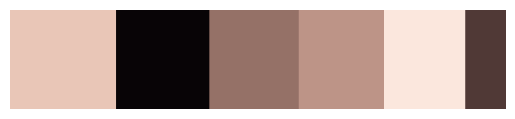

0.27156084345642006 clear


(0.27156084345642006, 'clear')

In [92]:
newclearorsoft(facialrecognition("darkwintercool.png"))

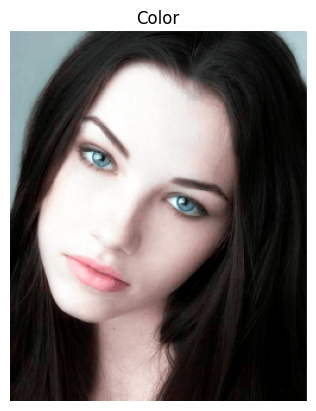

Found 1 faces!
face 0: [  0  42 216 216]
the face that is probably a face is 0 with a size of 46656
Drawn! How does it do?


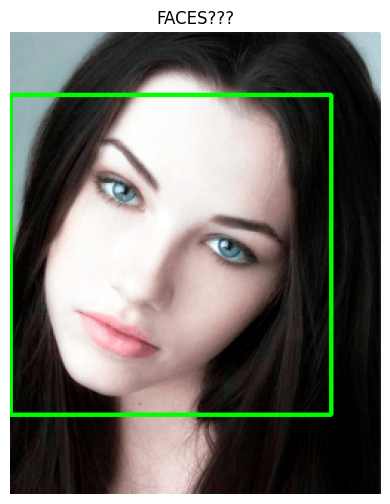

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


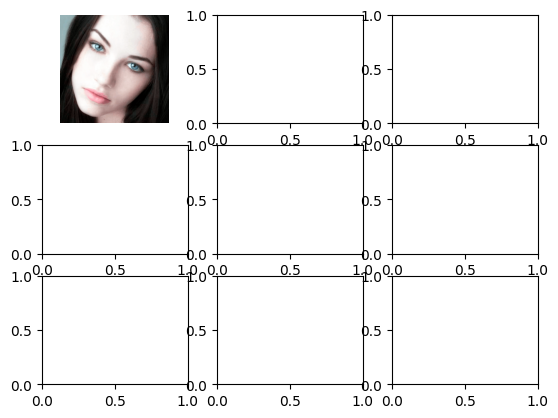

6
Color Bar
6 after


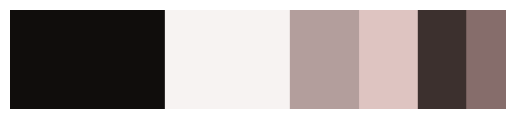

0.3128658583014108 clear


(0.3128658583014108, 'clear')

In [93]:
newclearorsoft(facialrecognition("truewintercool.png"))

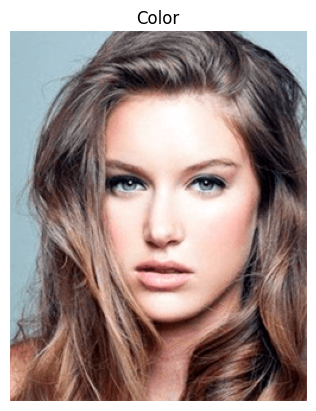

Found 1 faces!
face 0: [ 43  61 177 177]
the face that is probably a face is 0 with a size of 31329
Drawn! How does it do?


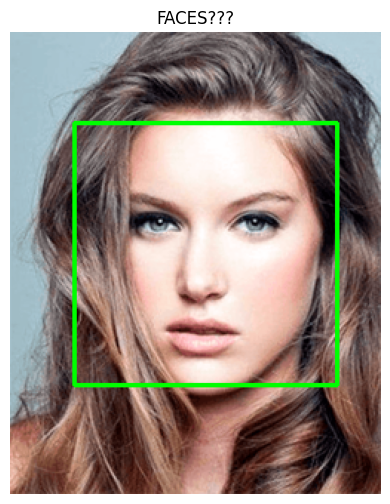

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


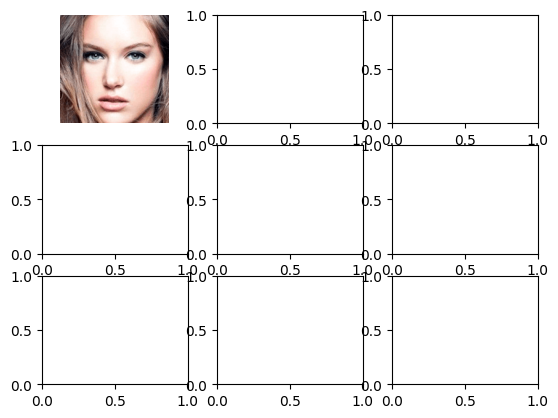

6
Color Bar
6 after


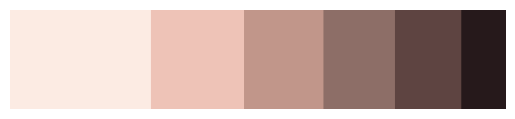

0.10344862846328592 clear


(0.10344862846328592, 'clear')

In [94]:
newclearorsoft(facialrecognition("softsummercool.png"))

## get the seasons



In [95]:
from typing import Tuple
import numpy as np

COLOR_SEASON_DICT = {
    # spring
    ("clear", "warm"): "bright spring",
    ("warm", "clear"): "true spring",
    ("light", "warm"): "light spring",
    # summer
    ("light", "cool"): "light summer",
    ("cool", "muted"): "true summer",
    ("muted", "cool"): "soft summer",
    # autumn
    ("muted", "warm"): "soft autumn",
    ("warm", "muted"): "true autumn",
    ("dark", "warm"): "dark autumn",
    # winter
    ("dark", "cool"): "dark winter",
    ("cool", "clear"): "true winter",
    ("clear", "cool"): "bright winter"
}

def match_characteristics_to_season(primary_characteristic: str,
                                    secondary_characteristic: str) -> str:
    return COLOR_SEASON_DICT[
        (primary_characteristic, secondary_characteristic)]


def get_primary_and_secondary_characteristics(
        imageinput
) -> Tuple[str, str]:
    # takes in an imageinput
    # hue = warmorcool(imageinput)
    print("GETTING FACE")
    face = facialrecognition(imageinput)
    print("GETTING HUE")

    huescore, hue = newwarmorcool(face)
    print("GETTING SAT")

    satscore, sat  = newclearorsoft(face)
    print("GETTING VAL")
    valscore, val = newdarkorlight(face)

    #TODO: just have the score already be calculated! And out of 100. 
    hsvlist = [[huescore, hue] , [satscore,sat], [valscore,val]]
    primarychar = max(hsvlist)[1]
    primarytuple = max(hsvlist)
    print(hue, sat, val, huescore, satscore, valscore)
    if "warm" == primarychar or "cool" == primarychar: 
        secondarychar = sat
      
     
    else:
        secondarychar = hue

    return primarychar, secondarychar, hue, huescore, sat, satscore, val, valscore
    
    


def identify_color_season(imageinput): #can be a url, fileimage, or numpyarray?
    # faces = detect_faces(img)

        # hue, sat, val = image_color_summarizer(face) 

        primary, secondary, hue, huescore, sat, satscore, val, valscore = get_primary_and_secondary_characteristics(imageinput) # take in a fileurl or fileimage. 
        color_season = match_characteristics_to_season(primary, secondary)

        return (f"(hue: {hue, huescore}, sat: {sat, satscore}, val: {val, valscore}), primary: {primary} , secondary: {secondary} so this person is a {color_season}!")


# the moment of truth!

GETTING FACE


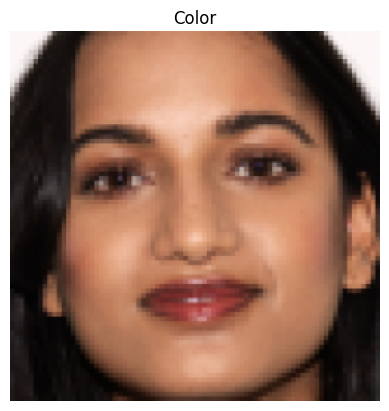

Found 1 faces!
face 0: [ 16  17 213 213]
the face that is probably a face is 0 with a size of 45369
Drawn! How does it do?


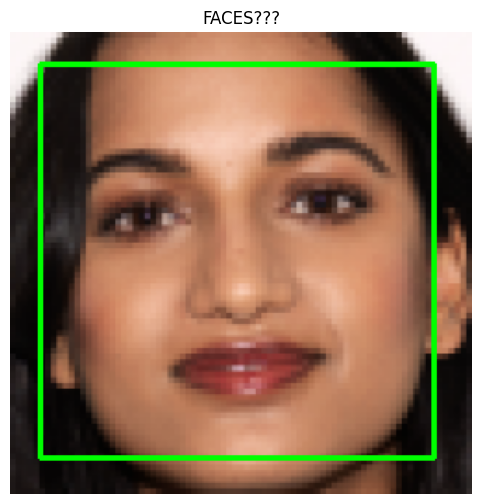

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


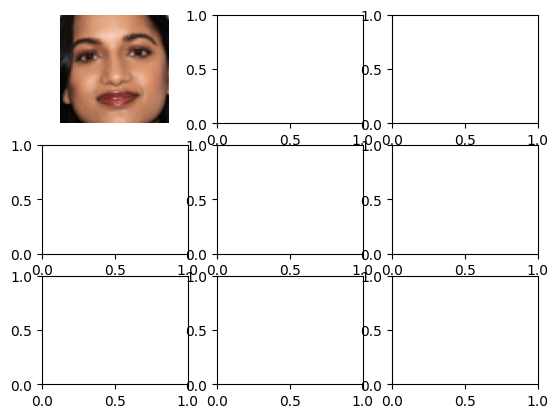

GETTING HUE


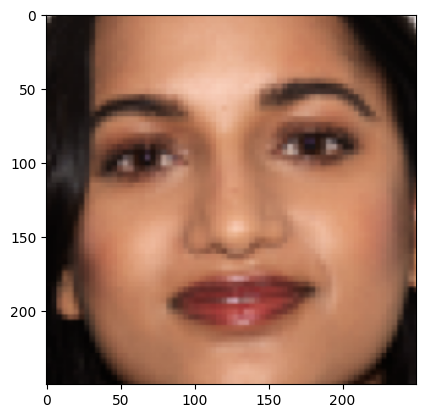

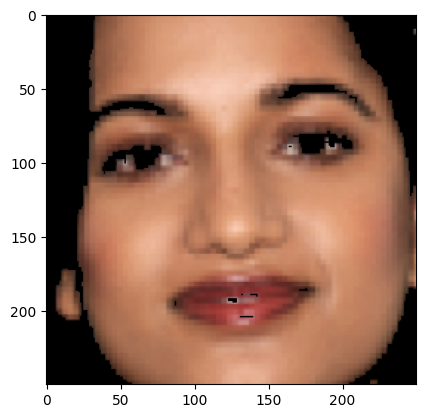

Color Information
Color Bar


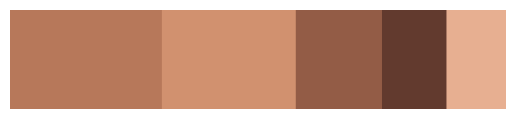

GETTING SAT
6
Color Bar
6 after


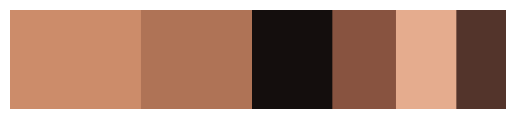

0.16020985707710345 clear
GETTING VAL


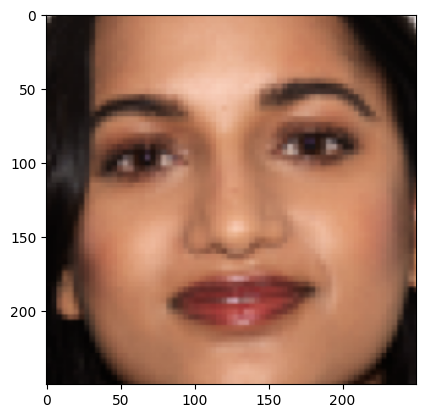

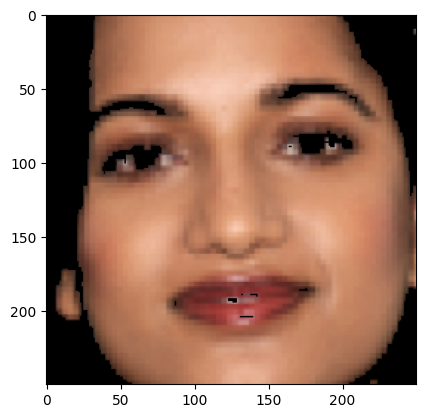

Color Information
Color Bar


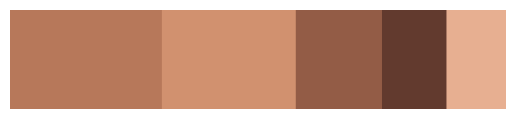

This person has tan skin
this person is light for  tan skin
0.509973118013829 light
warm clear light 0.002695915894596737 0.16020985707710345 0.509973118013829


"(hue: ('warm', 0.002695915894596737), sat: ('clear', 0.16020985707710345), val: ('light', 0.509973118013829)), primary: light , secondary: warm so this person is a light spring!"

In [96]:
identify_color_season(amita)

In [97]:
#OCt 19
#TODO: remove prints statements above
#TODO: fix the color season dict

GETTING FACE


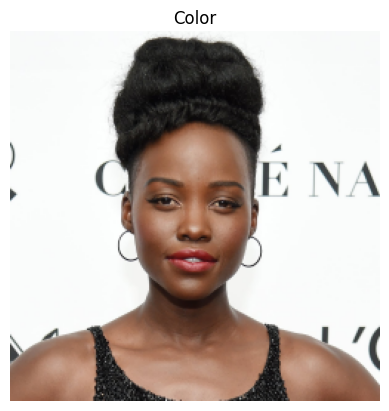

Found 1 faces!
face 0: [ 71  71 107 107]
the face that is probably a face is 0 with a size of 11449
Drawn! How does it do?


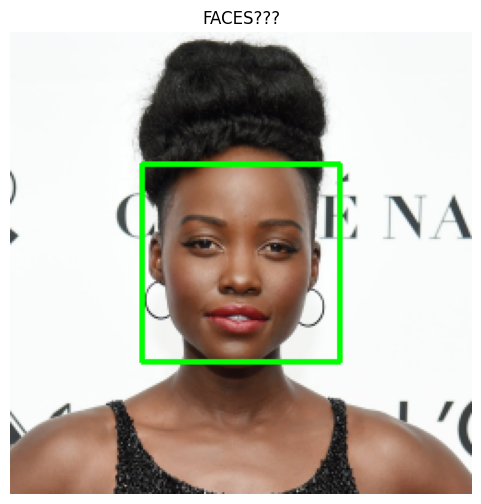

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


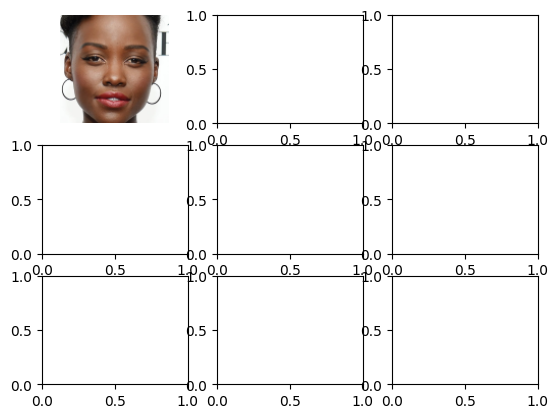

GETTING HUE


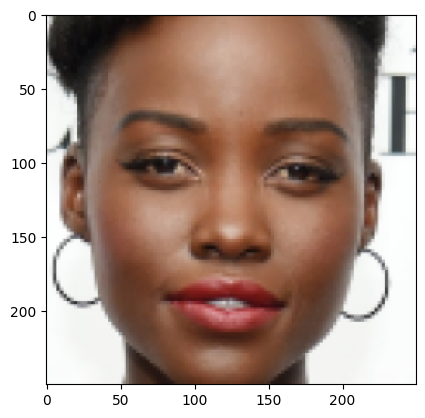

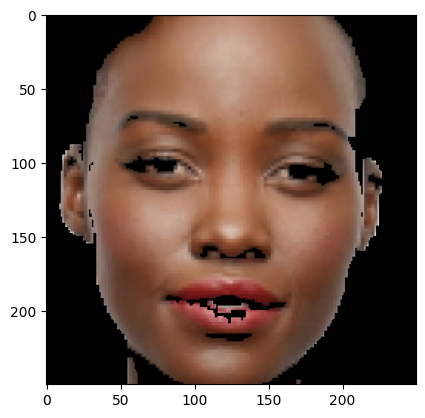

Color Information
Color Bar


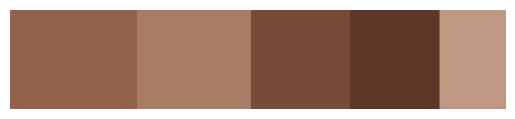

GETTING SAT
6
Color Bar
6 after


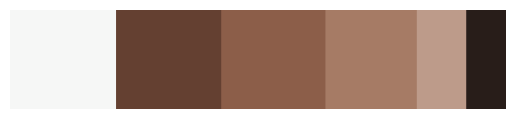

0.03157785428913946 clear
GETTING VAL


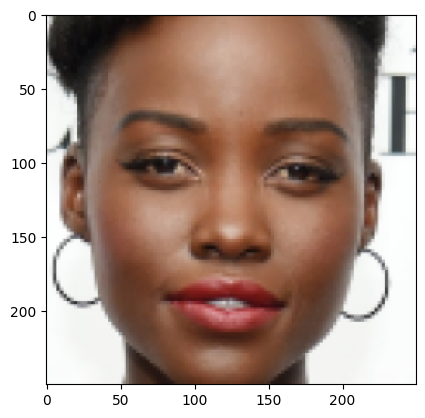

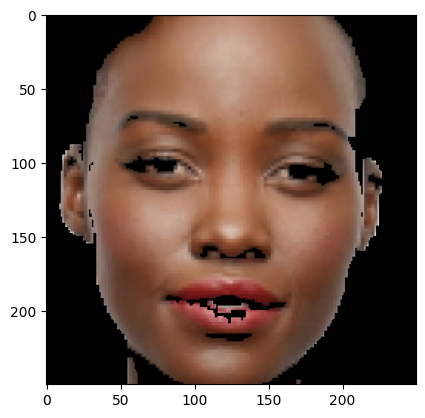

Color Information
Color Bar


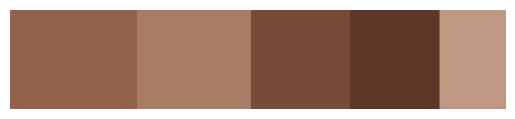

This person has tan skin
this person is dark for  tan skin
0.5076197075665362 dark
warm clear dark 0.0026476690942255393 0.03157785428913946 0.5076197075665362


"(hue: ('warm', 0.0026476690942255393), sat: ('clear', 0.03157785428913946), val: ('dark', 0.5076197075665362)), primary: dark , secondary: warm so this person is a dark autumn!"

In [98]:
identify_color_season("https://i.guim.co.uk/img/media/b818cb19f1b8eefaab97ffdc6096cf1b1f3b102d/145_336_2861_1717/master/2861.jpg?width=1200&height=1200&quality=85&auto=format&fit=crop&s=31918e4ebbdef0b8ebeada5767ba5b99")

GETTING FACE


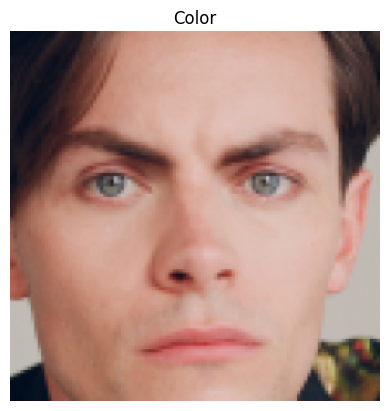

Found 1 faces!
face 0: [ 26  20 196 196]
the face that is probably a face is 0 with a size of 38416
Drawn! How does it do?


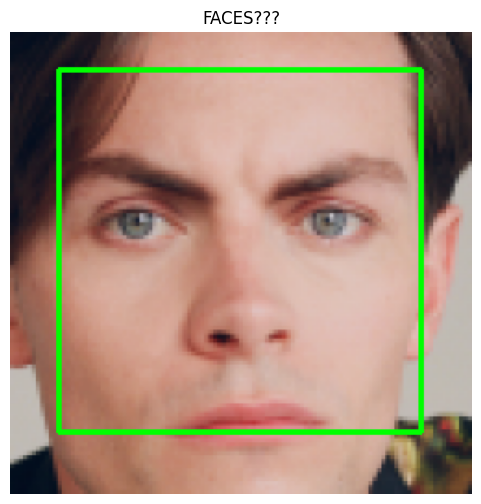

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


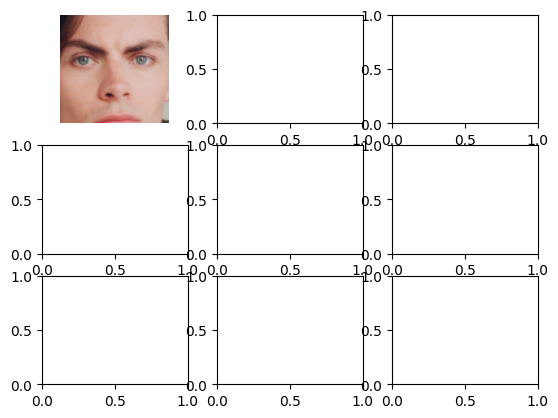

GETTING HUE


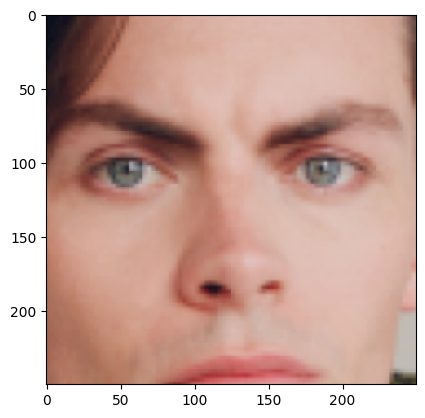

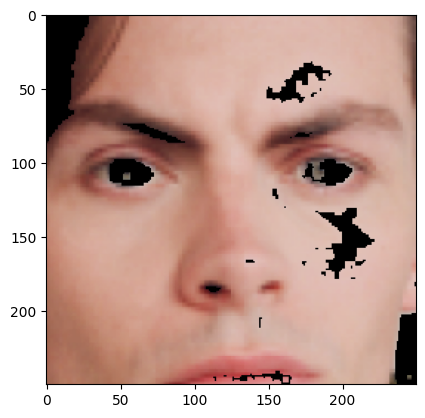

Color Information
Color Bar


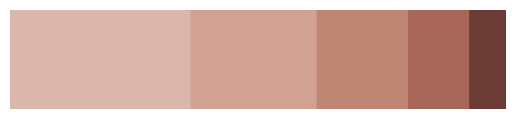

you are cool for  medium skin
0.4210355026710302 cool
GETTING SAT
6
Color Bar
6 after


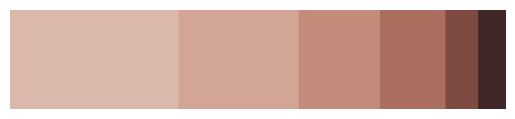

0.23561381645534984 soft
GETTING VAL


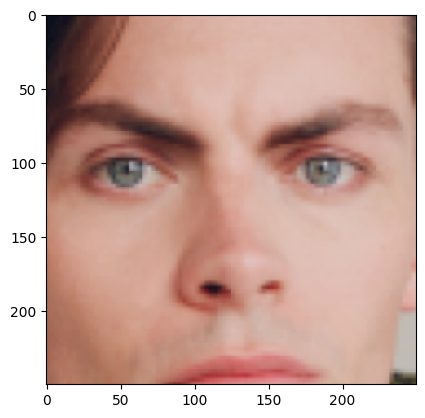

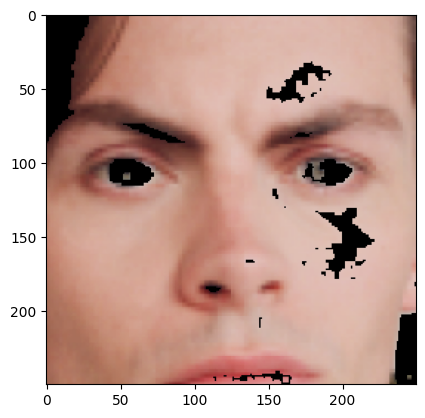

Color Information
Color Bar


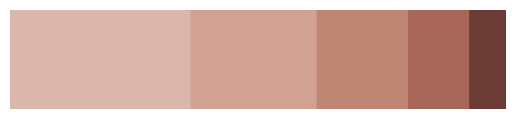

This person has medium skin
this person is light for  medium skin
0.6401638889287651 light
cool soft light 0.4210355026710302 0.23561381645534984 0.6401638889287651


"(hue: ('cool', 0.4210355026710302), sat: ('soft', 0.23561381645534984), val: ('light', 0.6401638889287651)), primary: light , secondary: cool so this person is a light summer!"

In [99]:
identify_color_season(freddyinput1)

In [100]:
## Try to extract white background?
# ignore the black background . 

## Try to extract eyes and use that? 

In [101]:
cd ..

/Users/waverlywang/Documents/CS189


In [102]:
pwd

'/Users/waverlywang/Documents/CS189'

In [103]:
cd CS189

[Errno 2] No such file or directory: 'CS189'
/Users/waverlywang/Documents/CS189


In [104]:
cd ..


/Users/waverlywang/Documents


In [105]:
identify_color_season("amanda.jpeg")

GETTING FACE


[ WARN:0@106.048] global /Users/xperience/actions-runner/_work/opencv-python/opencv-python/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('amanda.jpeg'): can't open/read file: check file path/integrity


AttributeError: 'NoneType' object has no attribute 'shape'

GETTING FACE


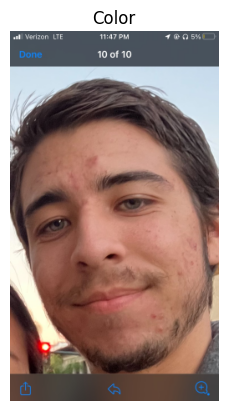

Found 1 faces!
face 0: [  1 127 225 225]
the face that is probably a face is 0 with a size of 50625
Drawn! How does it do?


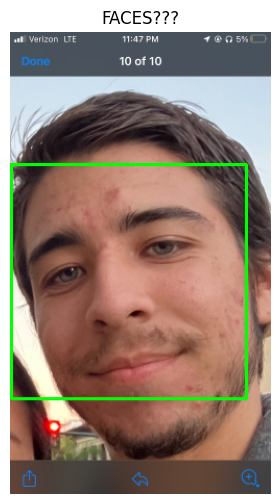

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


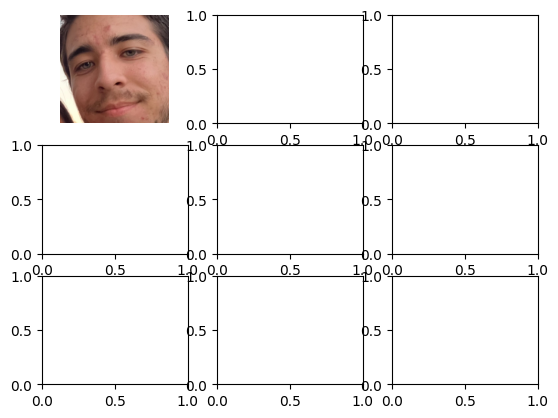

GETTING HUE


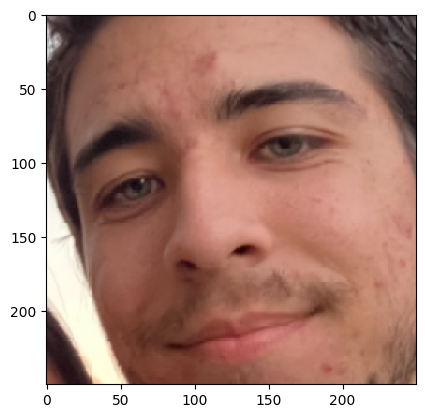

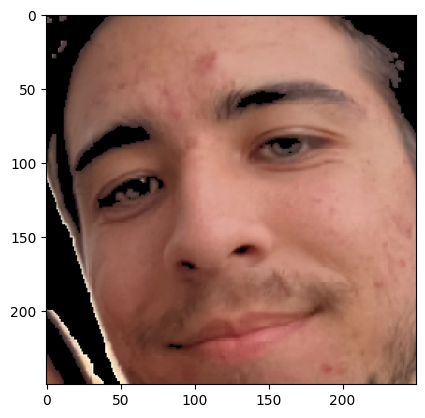

Color Information
Color Bar


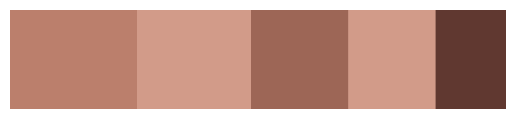

you are cool for  tan skin
0.32864719125977204 cool
GETTING SAT
6
Color Bar
6 after


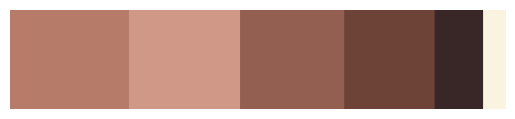

0.07522134324582619 soft
GETTING VAL


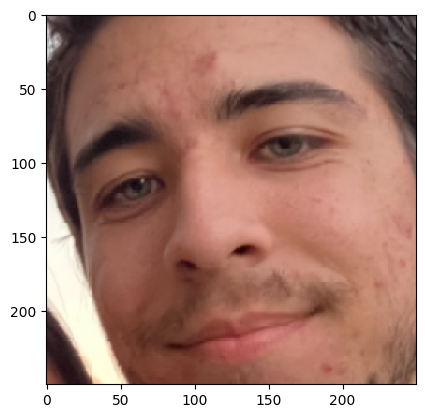

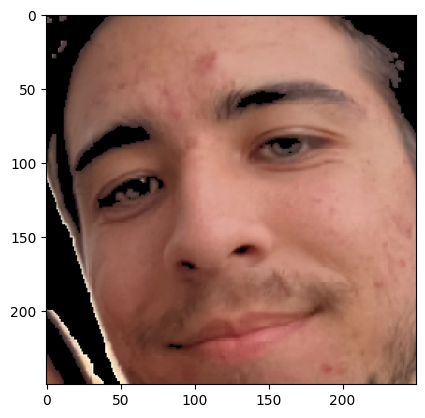

Color Information
Color Bar


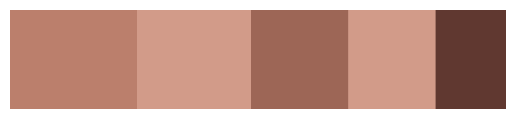

This person has tan skin
this person is light for  tan skin
0.6191743247020577 light
cool soft light 0.32864719125977204 0.07522134324582619 0.6191743247020577


"(hue: ('cool', 0.32864719125977204), sat: ('soft', 0.07522134324582619), val: ('light', 0.6191743247020577)), primary: light , secondary: cool so this person is a light summer!"

In [ ]:
identify_color_season("jessie.JPEG")

GETTING FACE


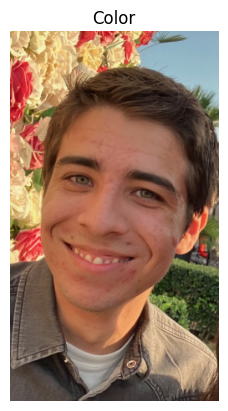

Found 1 faces!
face 0: [ 14 103 212 212]
the face that is probably a face is 0 with a size of 44944
Drawn! How does it do?


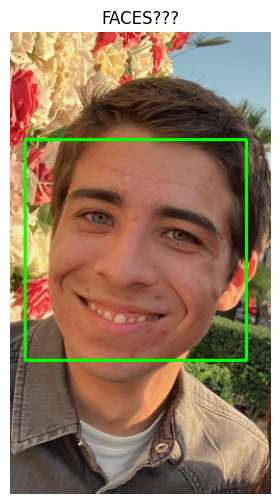

There are 1 faces detected - they are held in the list 'LoFi'
Here are some of them...


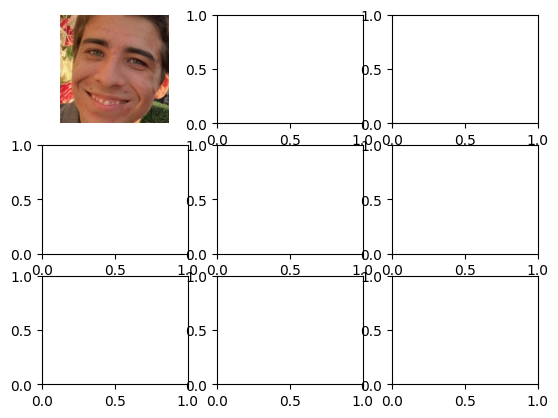

GETTING HUE


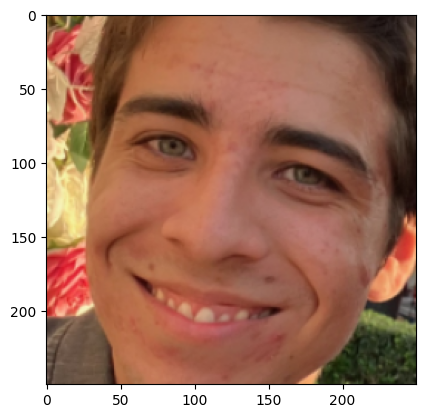

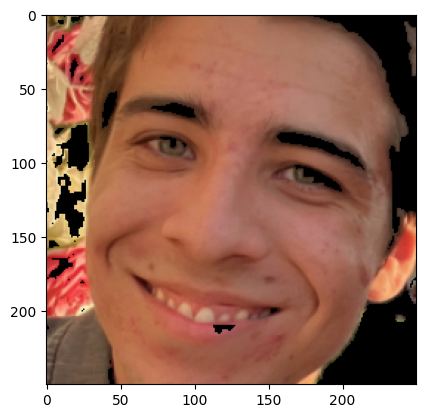

Color Information
Color Bar


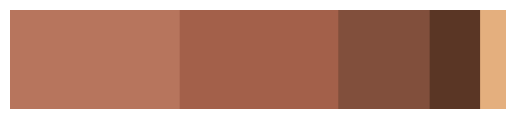

you are cool for  tan skin
0.2695396875286421 cool
GETTING SAT
6
Color Bar
6 after


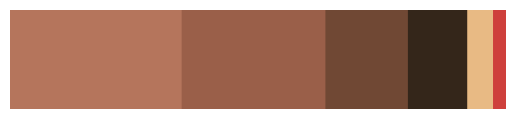

0.10670545102957596 soft
GETTING VAL


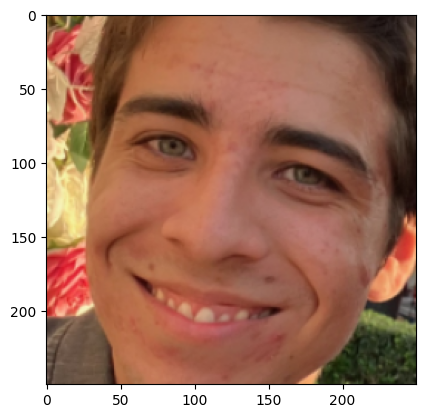

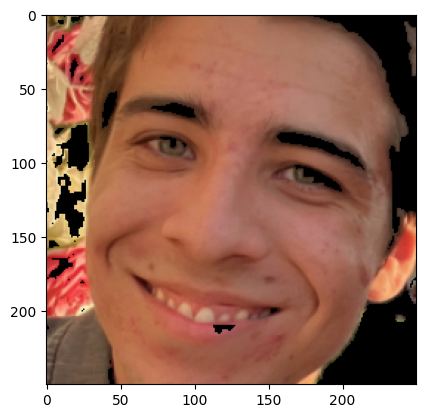

Color Information
Color Bar


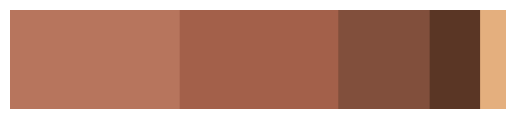

This person has tan skin
this person is light for  tan skin
0.5140460329472778 light
cool soft light 0.2695396875286421 0.10670545102957596 0.5140460329472778


"(hue: ('cool', 0.2695396875286421), sat: ('soft', 0.10670545102957596), val: ('light', 0.5140460329472778)), primary: light , secondary: cool so this person is a light summer!"

In [ ]:
identify_color_season("jessie2.JPEG")